# Fitting DC2 v2 Simulation Data with MultiProFit - Bootstrap Analysis Edition

This notebook plots results from fitting sources from the Vera Rubin Observatory/LSST Dark Energy Science Collaboration (DESC, https://lsstdesc.org/) DC2 simulations (http://lsstdesc.org/DC2-production/) using MultiProFit (https://github.com/lsst-dm/multiprofit, 'MPF'). Specifically, it reads the results of using a Task to fit exposures given a catalog with deblend sources generated by Scarlet (https://github.com/pmelchior/scarlet) existing catalog with fits from meas_modelfit (https://github.com/lsst/meas_modelfit, 'MMF'). MMF implements a variant of the SDSS CModel algorithm (https://www.sdss.org/dr12/algorithms/magnitudes/#cmodel). In additional to CModel, MultiProFit allows for multi-band fitting, as well as fitting of Sersic profiles, multi-Gaussian approximations thereof ('MG' Sersic), and non-parametric radial profiles (Gaussian mixtures model with shared ellipse parameters, effectively having a Gaussian mixture radial profile).

In [1]:
# Import requirements
from lsst.daf.persistence import Butler
import matplotlib as mpl
import matplotlib.pyplot as plt
import modelling_research.dc2 as dc2
import modelling_research.meas_model as mrMeas
from modelling_research.calibrate import calibrate_catalogs
from modelling_research.plotting import plotjoint_running_percentiles
import numpy as np
import seaborn as sns
from timeit import default_timer as timer

In [2]:
# Setup for plotting
%matplotlib inline
sns.set_style('darkgrid')
mpl.rcParams['figure.dpi'] = 160
mpl.rcParams['image.origin'] = 'lower'
sns.set(rc={'axes.facecolor': '0.85', 'figure.facecolor': 'w'})

In [3]:
# Catalog matching settings
# Reference band to match on. Should be 'r' for DC2 because reasons (truth refcats are r mag limited)
band_ref = 'r'

In [4]:
# Load the truth catalogs and count all of the rows
butler_ref = dc2.get_refcat(make=False)

In [5]:
# Load the DC2 repo butlers: we'll need them later
butlers_dc2 = {
    '2.2i': Butler('/project/dtaranu/dc2/scarlet/2020-12-17/ugrizy'),
}

In [6]:
# Match with the refcat using astropy's matcher
truth_path = dc2.get_truth_path()
tracts = {3828: (f'{truth_path}scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/', '2.2i'),}
filters_single = ('r',)
filters_multi = ('griz',)
band_multi = filters_multi[0]
patch_min, patch_max = 0, 6
patches_regex = f"[{patch_min}-{patch_max}]"
patches_regex = f"{patches_regex},{patches_regex}"
# Calibrate catalogs: this only needs to be done once; get_cmodel_forced should only be true for single bands for reasons
calibrate_cats = True
get_multiprofit = True
get_cmodel_forced = False
get_ngmix = False
get_scarlet = False
if calibrate_cats:
    butler_scarlet = Butler(f'/project/dtaranu/dc2/scarlet/2020-12-17/ugrizy') if get_scarlet else None
    path = tracts[3828][0]
    for bands in filters_single + filters_multi:
        butler_ngmix = Butler(f'/project/dtaranu/dc2/scarlet/2020-12-17_ngmix/{bands}') if get_ngmix else None
        is_single = len(bands) == 1
        files = [
            f'{path}{bands}/mpf_dc2_{bands}_3828_{x},{y}.fits'
            for x in range(patch_min, patch_max+1) for y in range(patch_min, patch_max+1)
        ]
        calibrate_catalogs(
            files, butlers_dc2, is_dc2=True, files_ngmix=butler_ngmix,
            butler_scarlet=butler_scarlet, get_cmodel_forced=get_cmodel_forced and is_single,
            overwrite_band=None, retry_delay=10, n_retry_max=3
        )
cats = {tract: datum['meas'] for tract, datum in dc2.match_refcat_dc2(
    butler_ref, match_afw=False, tracts=tracts, butlers_dc2=butlers_dc2,
    filters_single=filters_single, filters_multi=filters_multi, patches_regex=patches_regex
).items()}

ETA=Unknown; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_0,0.fits... Read in 8.2s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_0,0_mag.fits in 5.3s
ETA=645.2s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_0,1.fits... Read in 11.1s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_0,1_mag.fits in 5.8s
ETA=712.9s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_0,2.fits... Read in 8.9s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_0,2_mag.fits in 5.5s
ETA=685.8s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_0,3.fits... Read in 7.9s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-

ETA=255.2s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,3.fits... Read in 8.4s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,3_mag.fits in 4.9s
ETA=240.5s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,4.fits... Read in 8.4s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,4_mag.fits in 5.2s
ETA=226.1s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,5.fits... Read in 8.6s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,5_mag.fits in 5.2s
ETA=211.8s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,6.fits... Read in 7.2s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-no

ETA=657.1s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_1,5.fits... Read in 9.9s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_1,5_mag.fits in 9.7s
ETA=644.5s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_1,6.fits... Read in 9.3s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_1,6_mag.fits in 9.6s
ETA=629.0s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_2,0.fits... Read in 10.6s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_2,0_mag.fits in 8.7s
ETA=614.1s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_2,1.fits... Read in 10.2s
Calibrated /p

ETA=143.4s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_5,6.fits... Read in 8.6s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_5,6_mag.fits in 8.1s
ETA=125.3s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_6,0.fits... Read in 8.6s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_6,0_mag.fits in 8.2s
ETA=107.2s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_6,1.fits... Read in 8.5s
Calibrated /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_6,1_mag.fits in 7.9s
ETA=89.2s; Calibrating /project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_6,2.fits... Read in 9.3s
Calibrated /proj

Loaded in 15.9s; loading 4,3 (32/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,3_mag.fits; len(cat,truth)=498791,3357001
Loaded in 16.4s; loading 4,4 (33/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,4_mag.fits; len(cat,truth)=515481,3461529
Loaded in 24.4s; loading 4,5 (34/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,5_mag.fits; len(cat,truth)=531346,3566017
Loaded in 17.1s; loading 4,6 (35/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_4,6_mag.fits; len(cat,truth)=544862,3662093
Loaded in 24.0s; loading 5,0 (36/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/r/mpf_dc2_r_3828_5,0_mag.fits; len(cat,truth)=558191,3764813
Loaded in 24.4s; loading 5,1 (37/49) and

Loaded in 3.9s; loading 3,5 (27/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_3,5_mag.fits; len(cat,truth)=421541,5111088
Loaded in 4.9s; loading 3,6 (28/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_3,6_mag.fits; len(cat,truth)=435614,5111088
Loaded in 4.4s; loading 4,0 (29/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_4,0_mag.fits; len(cat,truth)=449725,5111088
Loaded in 3.6s; loading 4,1 (30/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_4,1_mag.fits; len(cat,truth)=466077,5111088
Loaded in 3.7s; loading 4,2 (31/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer-deblend-noiseBias/griz/mpf_dc2_griz_3828_4,2_mag.fits; len(cat,truth)=483144,5111088
Loaded in 6.9s; loading 4,3 (32/49) file=/project/dtaranu/dc2/scarlet/2020-12-17

In [7]:
# Load original (i.e. truth/input) param values. Matching is redundant but oh well.
tracts_orig = {3828: (f'{truth_path}scarlet/2020-12-17_mpf-noiseReplacer/', '2.2i'),}
cats_orig = {tract: datum['meas'] for tract, datum in dc2.match_refcat_dc2(
    butler_ref, match_afw=False, tracts=tracts_orig, butlers_dc2=butlers_dc2,
    filters_single=filters_single, filters_multi=filters_multi, patches_regex=patches_regex
).items()}

Loading tract 3828 band r
Loading 49 files from path=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_[0-6],[0-6]_mag.fits
Loaded in 19.5s; loading 0,0 (1/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_0,0_mag.fits; len(cat,truth)=11685,109327
Loaded in 27.4s; loading 0,1 (2/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_0,1_mag.fits; len(cat,truth)=26563,214159
Loaded in 26.4s; loading 0,2 (3/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_0,2_mag.fits; len(cat,truth)=40383,322489
Loaded in 27.8s; loading 0,3 (4/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_0,3_mag.fits; len(cat,truth)=53382,425421
Loaded in 27.7s; loading 0,4 (5/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_0,4_mag.fits; len(cat,truth)=68101,534

Loaded in 58.3s; loading 6,5 (48/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_6,5_mag.fits; len(cat,truth)=727658,5008305
Loaded in 25.0s; loading 6,6 (49/49) and matching file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/r/mpf_dc2_r_3828_6,6_mag.fits; len(cat,truth)=738599,5111088
Loading tract 3828 band griz
Loading 49 files from path=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/griz/mpf_dc2_griz_3828_[0-6],[0-6]_mag.fits
Loaded in 6.2s; loading 0,0 (1/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/griz/mpf_dc2_griz_3828_0,0_mag.fits; len(cat,truth)=11685,5111088
Loaded in 4.3s; loading 0,1 (2/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/griz/mpf_dc2_griz_3828_0,1_mag.fits; len(cat,truth)=26563,5111088
Loaded in 7.5s; loading 0,2 (3/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/griz/mpf_dc2_griz_3828_0,2_mag.fits; len(cat,truth)=40383,5111088
Lo

Loaded in 4.3s; loading 6,5 (48/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/griz/mpf_dc2_griz_3828_6,5_mag.fits; len(cat,truth)=727658,5111088
Loaded in 3.8s; loading 6,6 (49/49) file=/project/dtaranu/dc2/scarlet/2020-12-17_mpf-noiseReplacer/griz/mpf_dc2_griz_3828_6,6_mag.fits; len(cat,truth)=738599,5111088


## Crossmatch against reference catalog

All of the plots in this notebook compare stack measurements of sources measured by the LSST Science Pipelines cross-matched against a reference catalog that is part of the Science Pipelines repository. This reference catalog contains all sources brighter than 23 mags in r, and was generated through some kind of Task that must have read the original DC2 truth tables (more on that below).

In [8]:
# Model plot setup
# ngmix takes out a pixel scale factor of 2.5*log10(0.2**2)
# TODO: remove this offset when fixed in ngmix
offset_ngmix = -3.4948500216800937
model_specs = [
    ('PSF', 'base_PsfFlux', 1),
    ('Stack CModel', 'modelfit_CModel', 2),
    ('Forced CModel', 'modelfit_forced_CModel', 2),
] if get_cmodel_forced else []
if get_scarlet:
    model_specs.append(('Scarlet', 'scarlet', 0))
if get_multiprofit:
    model_specs.extend([
        ('MPF Gauss', 'multiprofit_gausspx', 1),
        ('MPF CModel', 'multiprofit_mg8cmodelpx', 2),
        ('MPF Sersic', 'multiprofit_mg8serbpx', 1),
        ('MPF Sersic Free Amp.', 'multiprofit_mg8serbapx', 8),
        #('MPF Sersic x 2', 'multiprofit_mg8serx2sepx', 2),
        #('MPF Sersic x 2 Free Amp.', 'multiprofit_mg8serx2seapx', 16),
    ])
if get_ngmix:
    model_specs.append(('ngmix bd', 'ngmix_bd', 0))

models = {
    desc: mrMeas.Model(desc, field, n_comps, mag_offset=offset_ngmix if mrMeas.is_field_ngmix(field) else None)
    for desc, field, n_comps in model_specs
}

models_stars = ['PSF', 'Stack CModel'] if get_cmodel_forced else []
if get_multiprofit:
    models_stars.extend(['MPF Gauss', 'MPF CModel', 'MPF Sersic'])
if get_ngmix:
    models_stars.append('ngmix bd')
if get_scarlet:
    model_specs.append('Scarlet')

models_stars = {model: models[model] for model in models_stars}

args = dict(scatterleft=True, scatterright=True,)
args_type = {
    'resolved': {
        'limx': (14.5, 24.5),
        'limy': (-0.5, 0.5),
    },
    'unresolved': {
        'limx': (16, 23),
        'limy': (-0.08, 0.08),
    },
}
mpl.rcParams['axes.labelsize'] = 15

In [9]:
def plot_models(
    models, cats, cats_orig, filters_single, band_multi, is_galaxies, args_all, args_type, band_ref='r', size_resolved=0.02,
):
    source_type = 'galaxies' if is_galaxies else 'stars'
    for model_desc, model in models.items():
        is_mpf_cmodel = model_desc == 'MPF CModel'
        models_size = [mrMeas.Model('', f'multiprofit_mg8{sub}px', 1) for sub in ('expg', 'deve')] if is_mpf_cmodel else (
            models['MPF Sersic'] if model_desc == 'MPF Sersic Free Amp.' else model
        )
        x_p, y_p, band_p = None, None, None
        children = {}
        for tract, cats_type in cats_orig.items():
            cat = cats_type[band_multi]
            # TODO: Use parent detect_isPatchInner instead?
            children_tract = (cat['detect_isPrimary'] * cat['detect_isPatchInner'] * (cat['parent'] != 0) * ~(cat['merge_peak_sky'] == 1) 
                * ~cat['deblend_tooManyPeaks'] * ~cat['base_PixelFlags_flag_saturatedCenter'])
            size_terms = [
                (model_size.get_flux_total(cat, band_ref), model_size.get_ellipse_terms(cat, band_ref, comp=1)[0]**2)
                for model_size in models_size
            ] if is_mpf_cmodel else None
            sizes = models_size.get_ellipse_terms(cat, band_ref, comp=1)[0] if not is_mpf_cmodel else np.sqrt(
                 (size_terms[0][0]*size_terms[0][1] + size_terms[1][0]*size_terms[1][1])/(size_terms[0][0] + size_terms[1][0])
            )
            resolved = sizes > size_resolved
            children_tract *= resolved == is_galaxies
            print(f'Tract {tract} has {np.sum(resolved)} resolved sources and {np.sum(~resolved)} unresolved'
                  f' ({model_desc}={model.name} size < {size_resolved}) totalling {np.sum(children_tract)} good sources')
            children[tract] = (children_tract, cat[children_tract])
        for band in filters_single:
            mags = ([], [])
            for tract, cats_tract in cats.items():
                children_tract, cat_children = children[tract]
                for idx, rows in enumerate((cat_children, cats_tract[band_multi][children_tract])):
                    mags[idx].append(model.get_mag_total(rows, band))
            mags = [np.concatenate(x) for x in mags]
            x = mags[0]
            y = mags[1] - x
            # The mags should only be identical if the fit didn't run
            # The main reason for that would be the parent having base_PixelFlags_flag_saturatedCenter set
            good = (y != 0) * (x < 24.5)
            title = f'DC2 {tract} {source_type} {band}-band, {model_desc} ({band_multi}), N={np.sum(good)}'
            print(title)
            labelx = f'${band}_{{true}}$'
            y_good = y[good]
            plotjoint_running_percentiles(x[good], y_good, title=title,
                labelx=labelx, labely=f'${band}_{{model}}$ - {labelx}',
                **args_all, **args_type,
            )
            plt.show()
            if y_p is not None:
                if x_p is None:
                    x_p = x
                    label_colour = f'${band}_{{true}}$'
                title = f'DC2 {tract} {source_type} {band_p}-{band}, {model_desc} ({band_multi}), N={np.sum(good)}'
                print(title, len(x_p), len(y_p), len(y))
                plotjoint_running_percentiles(x_p[good], y_p[good] - y_good, title=title,
                    labelx=label_colour, labely=f'$({band_p}-{band})_{{model-true}}$',
                    **args_all, **args_type,
                )
            y_p = y
            band_p = band

## Galaxy fluxes and colours

These plots show fluxes and colours for a variety of models, separately for DC2.1.1 (tract 3832) and DC2.2 (tract 3828).

Quick summary:

1. Bright and faint galaxies alike are a challenge, with large scatter in the former and a negative (model too bright) bias in the latter.
    - This is not very surprising; bright galaxies are more likely to be blended, but model mismatch shouldn't be as much of an issue here. Some kind of bias and scatter at the faint end is not surprising either, though how much and in which direction is not so clear.
2. Colours have considerably less scatter, even for single-band fits; that is, even though bright galaxies have differences much larger than expected from noise bias alone, these are about the same in each band.
    - This is somewhat encouraging if not unexpected. It's not entirely a trivial result for g-r as it is for r-i (for low redshift galaxies anyways).
3. There is at best a modest improvement from meas_modelfit (mmf) CModel to MultiProFit (mpf) CModel. The main differences here are: free centroids for mpf vs fixed in mmf; slightly different Sersic approximation (more so for dev than exp); double Gaussian vs double Shapelet PSF in mpf vs mmf (the latter ought to be better); size prior in mmf; different optimizers; analytic vs finite difference gradients in mpf vs mmf. Of all of those differences, the free centroids are most likely to provide the (modest) benefit, if any.
    - This is a more or less neutral result; I woudln't expect much difference between the two for any of the possible reasons.
4. There is a slightly more substantial improvment for single-band fluxes from CModel to Sersic; in particular, the distribution of galaxies with overestimated fluxes is tighter.
    - This is also somewhat encouraging. We know that CModel is a kludge, but it's not trivial for slightly-but-not-entirely-more-principled Sersic fits to peform better.
5. Nearly everything is improved by fitting gri simultaneously - magnitudes, colours, etc. all have tigher scatter no matter the model or band. While the improvements in one-sigma scatter for magnitudes are not necessarily large, the 2+sigma scatter is significantly tighter, as are colours.
    - This is very encouraging and non-trivial; one could have imagined galaxies with non-detections in some bands to have more biased measurements in the bands with detections, but that doesn't seem to be the case very often. Of course it's at least partly expected since the morphology of the galaxy is identical in all bands in single-component models, but the fact that this improves colours substantially without making magnitudes worse is a major bonus.

Tract 3828 has 733311 resolved sources and 5288 unresolved (MPF Gauss=multiprofit_gausspx size < 0.02) totalling 733066 good sources
DC2 3828 galaxies g-band, MPF Gauss (griz), N=57245


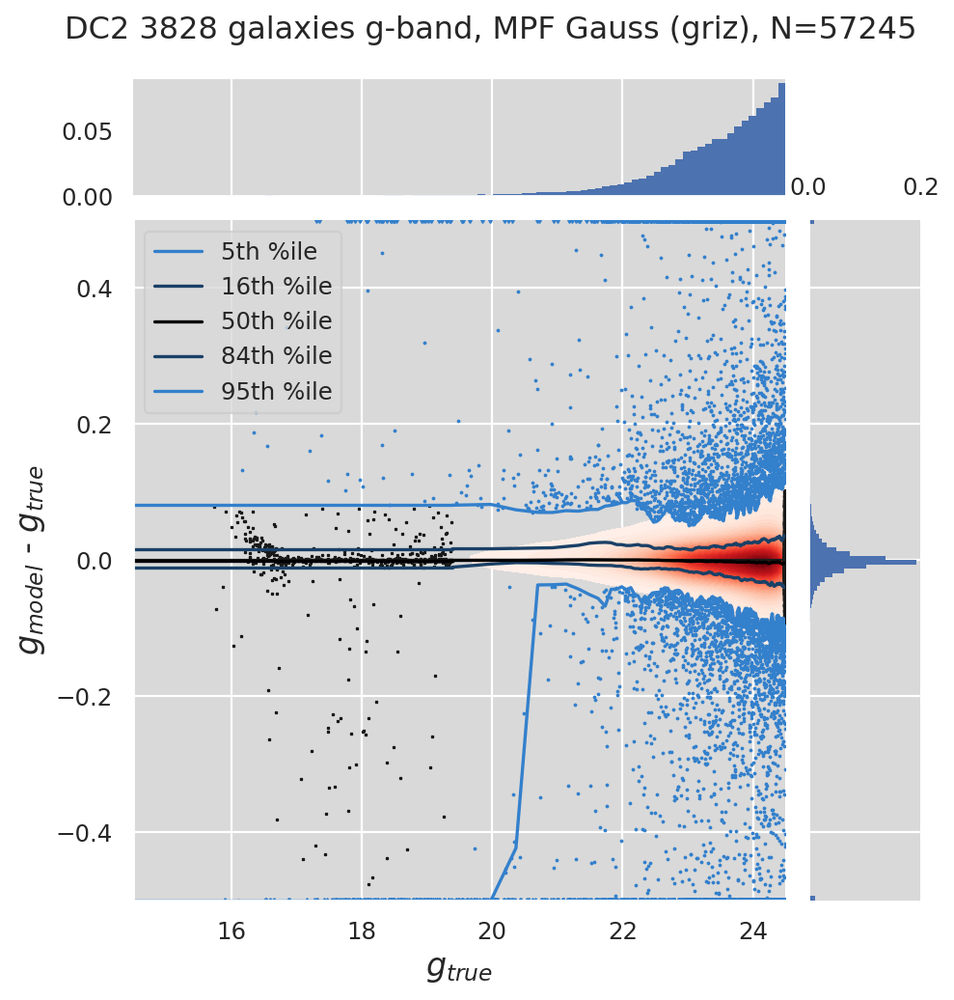

DC2 3828 galaxies r-band, MPF Gauss (griz), N=86987


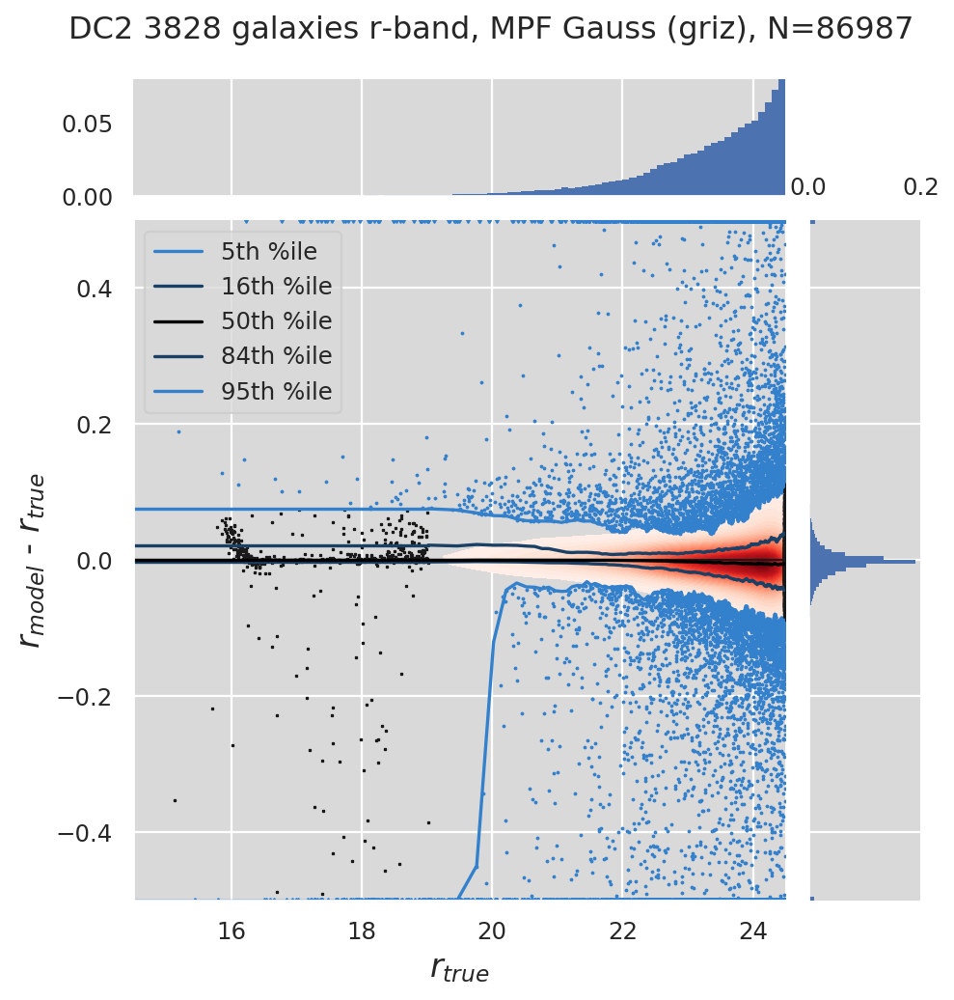

DC2 3828 galaxies g-r, MPF Gauss (griz), N=86987 733066 733066 733066
DC2 3828 galaxies i-band, MPF Gauss (griz), N=130847


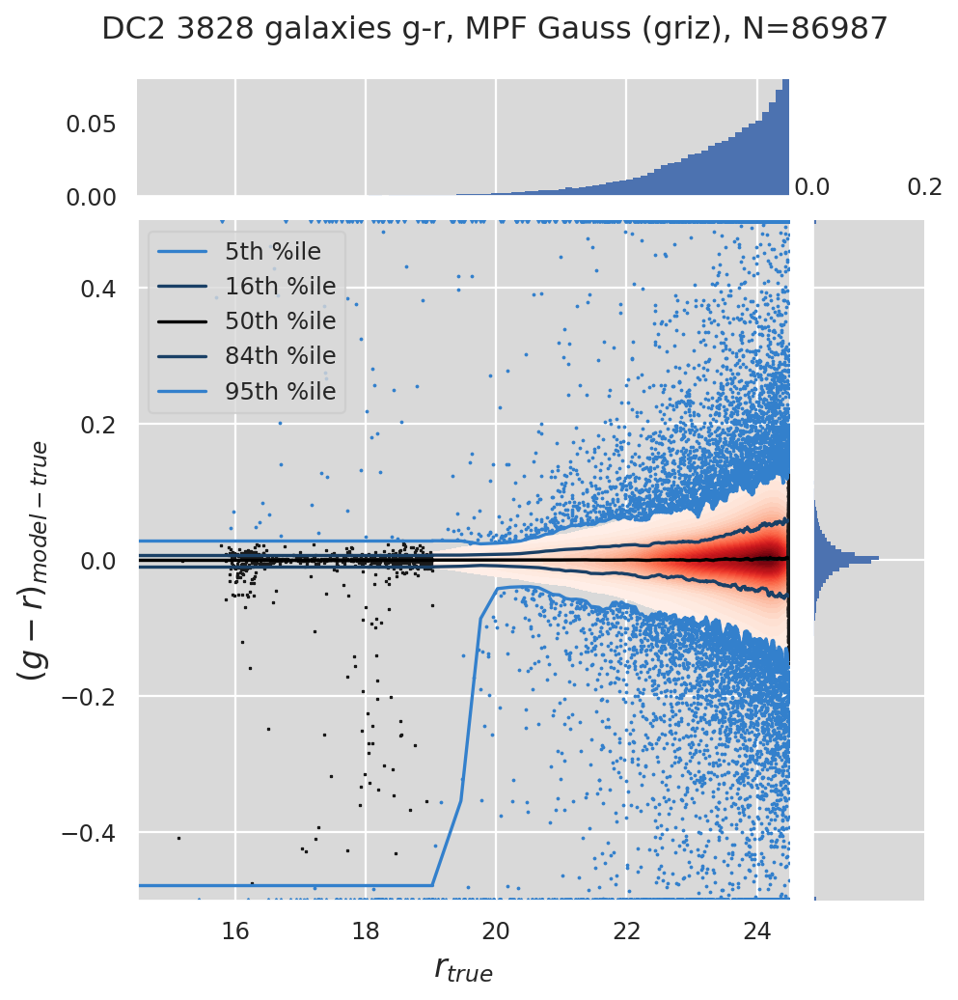

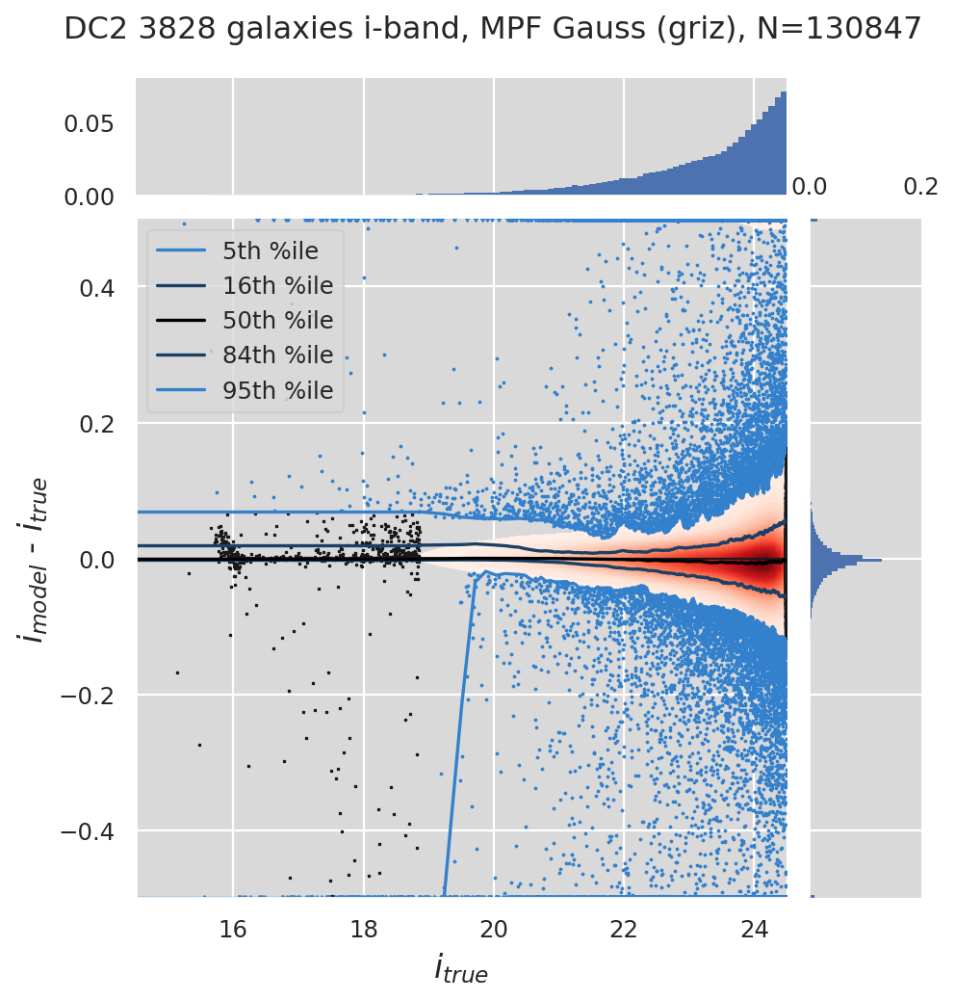

DC2 3828 galaxies r-i, MPF Gauss (griz), N=130847 733066 733066 733066
DC2 3828 galaxies z-band, MPF Gauss (griz), N=190509


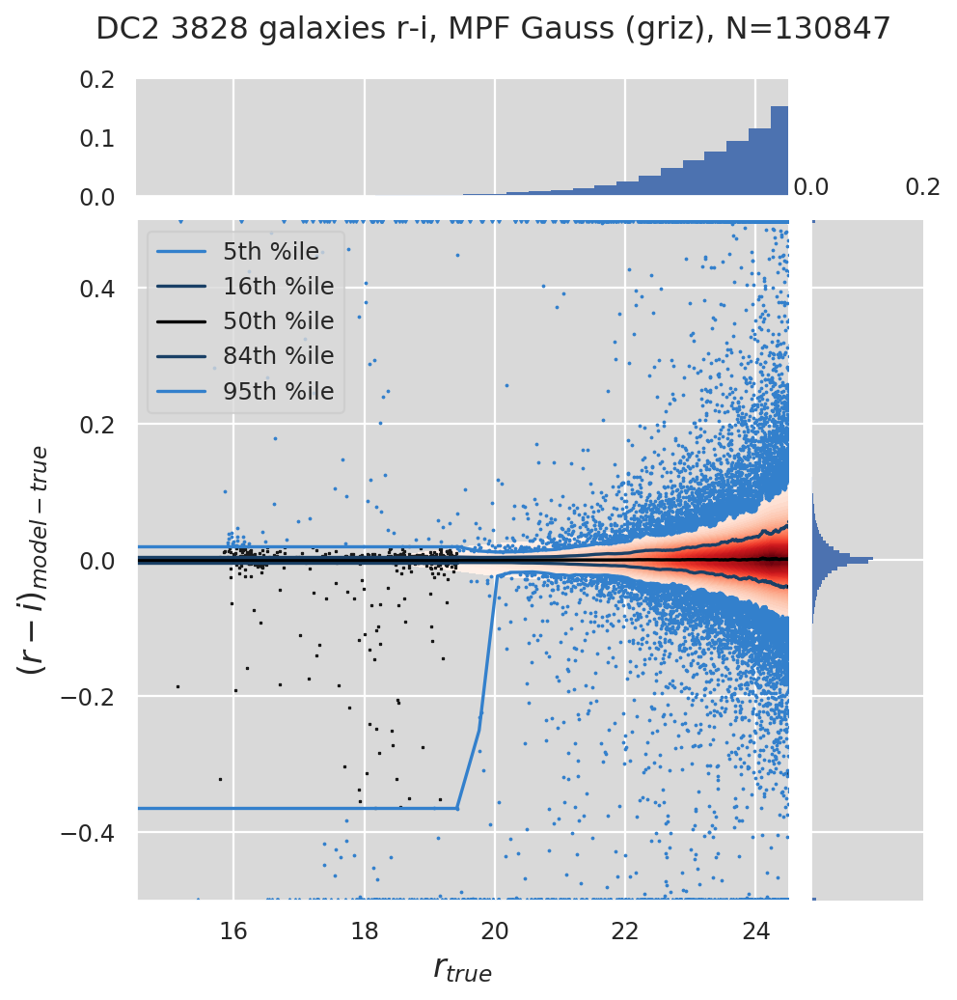

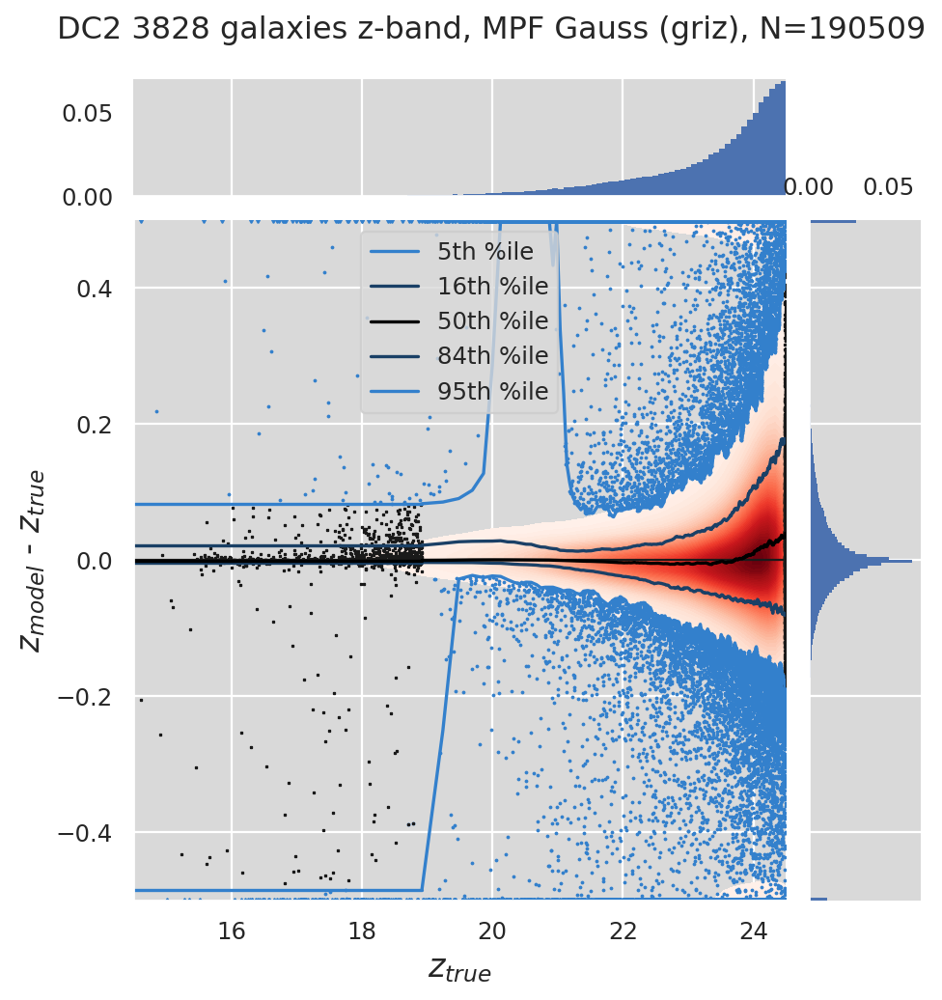

DC2 3828 galaxies i-z, MPF Gauss (griz), N=190509 733066 733066 733066
Tract 3828 has 733976 resolved sources and 4623 unresolved (MPF CModel=multiprofit_mg8cmodelpx size < 0.02) totalling 733731 good sources
DC2 3828 galaxies g-band, MPF CModel (griz), N=62913


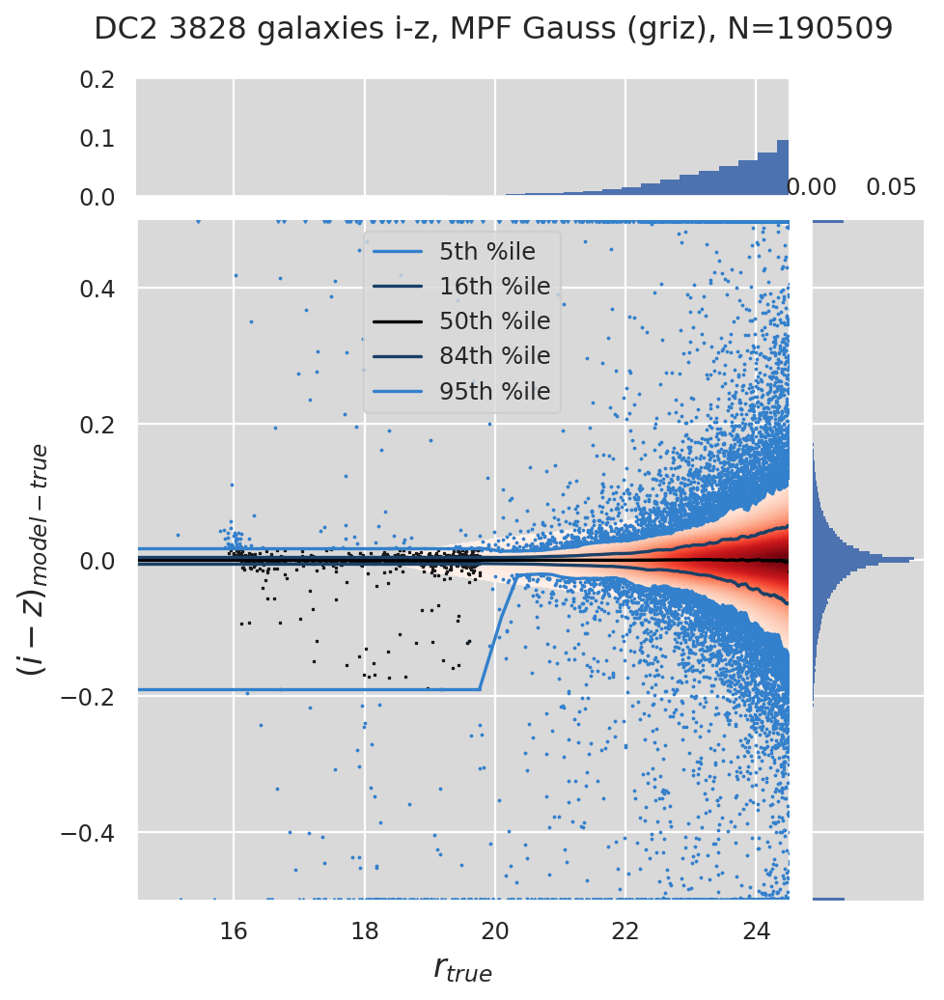

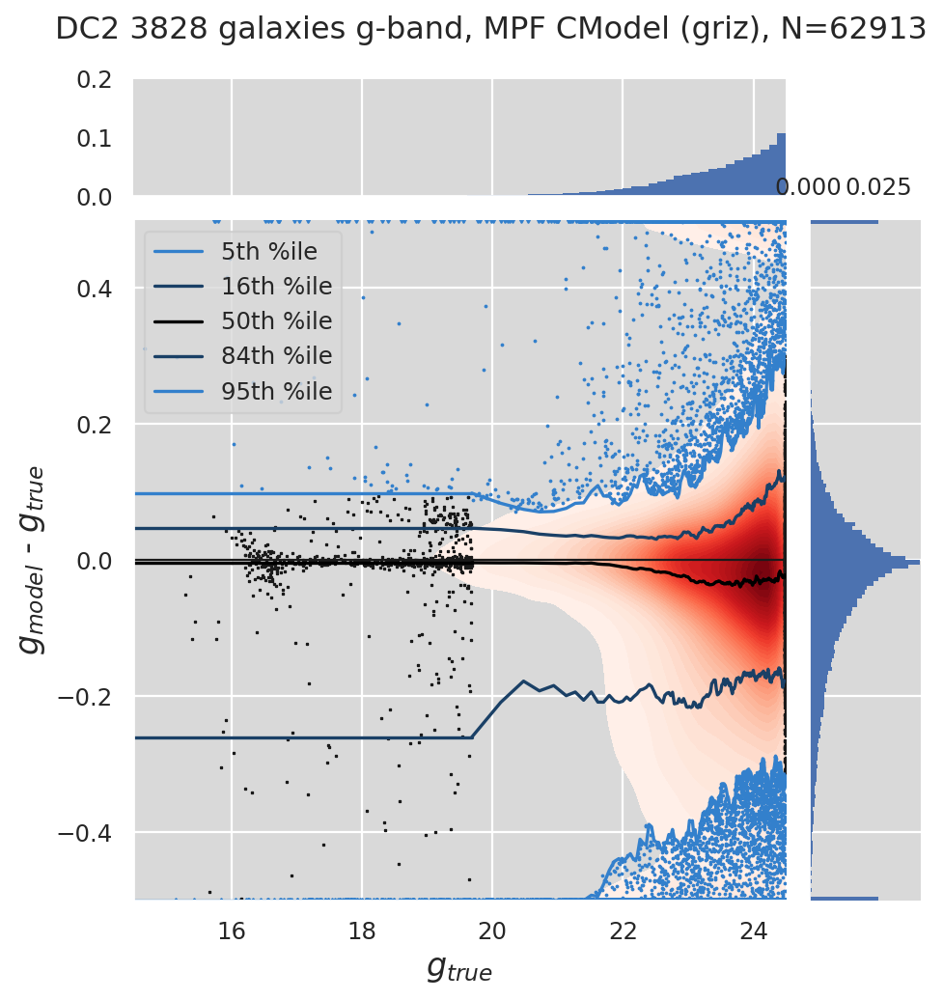

DC2 3828 galaxies r-band, MPF CModel (griz), N=96075


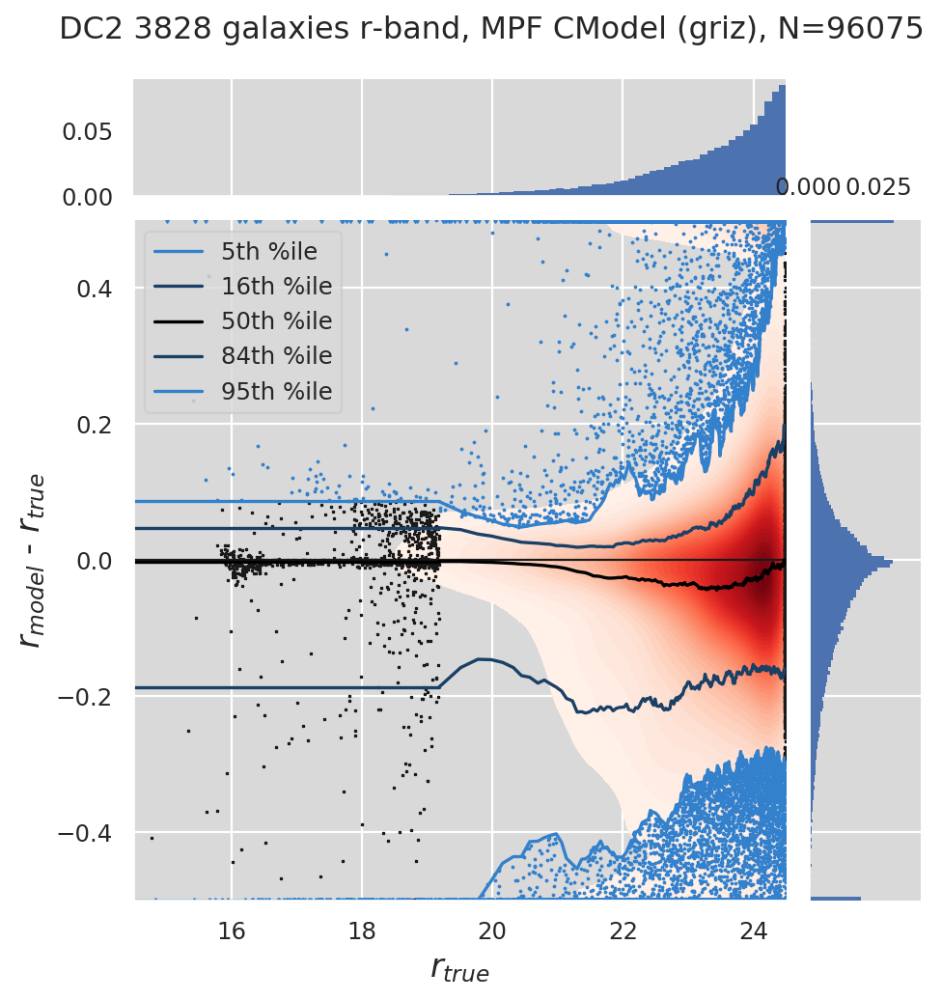

DC2 3828 galaxies g-r, MPF CModel (griz), N=96075 733731 733731 733731
DC2 3828 galaxies i-band, MPF CModel (griz), N=146678


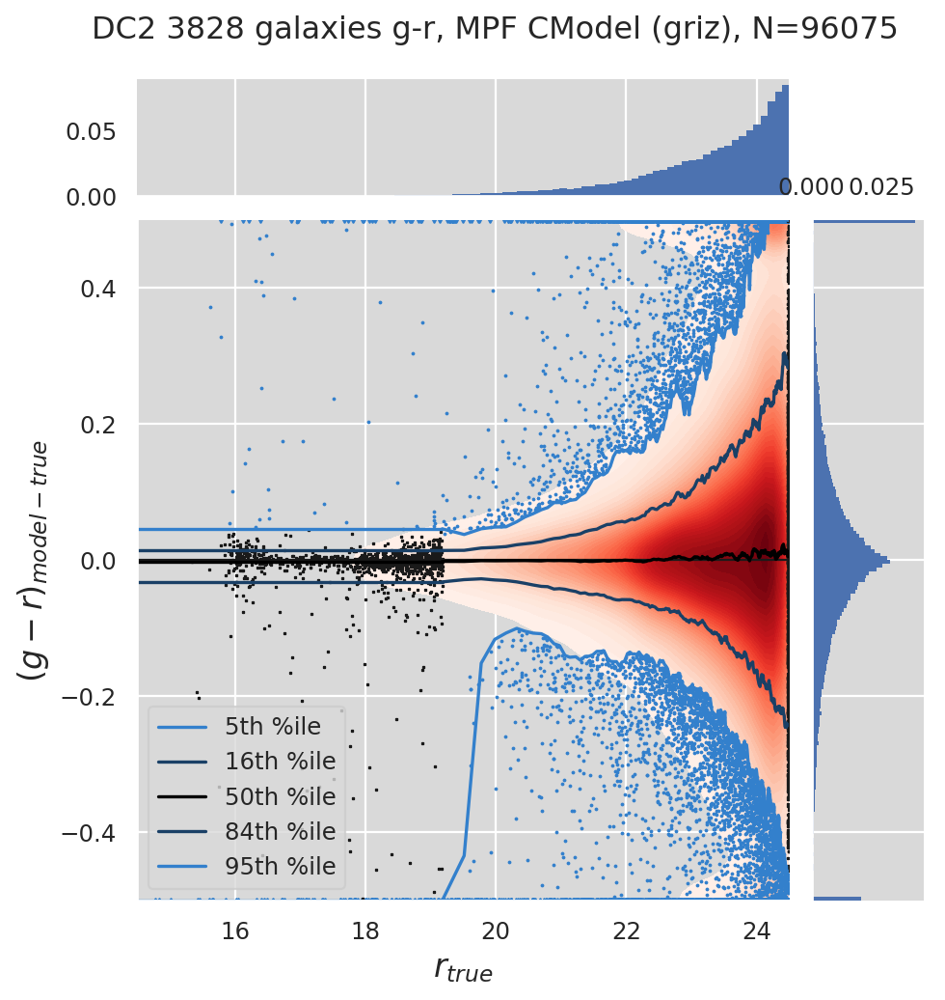

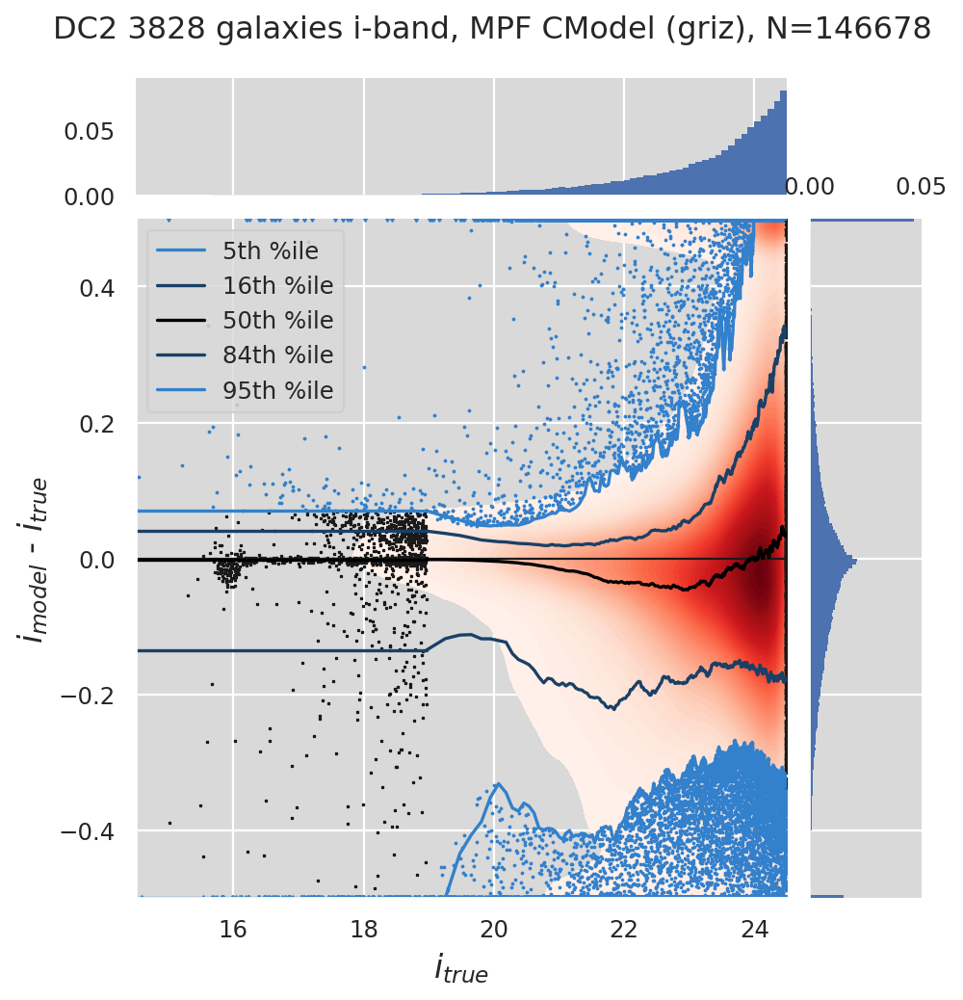

DC2 3828 galaxies r-i, MPF CModel (griz), N=146678 733731 733731 733731
DC2 3828 galaxies z-band, MPF CModel (griz), N=206600


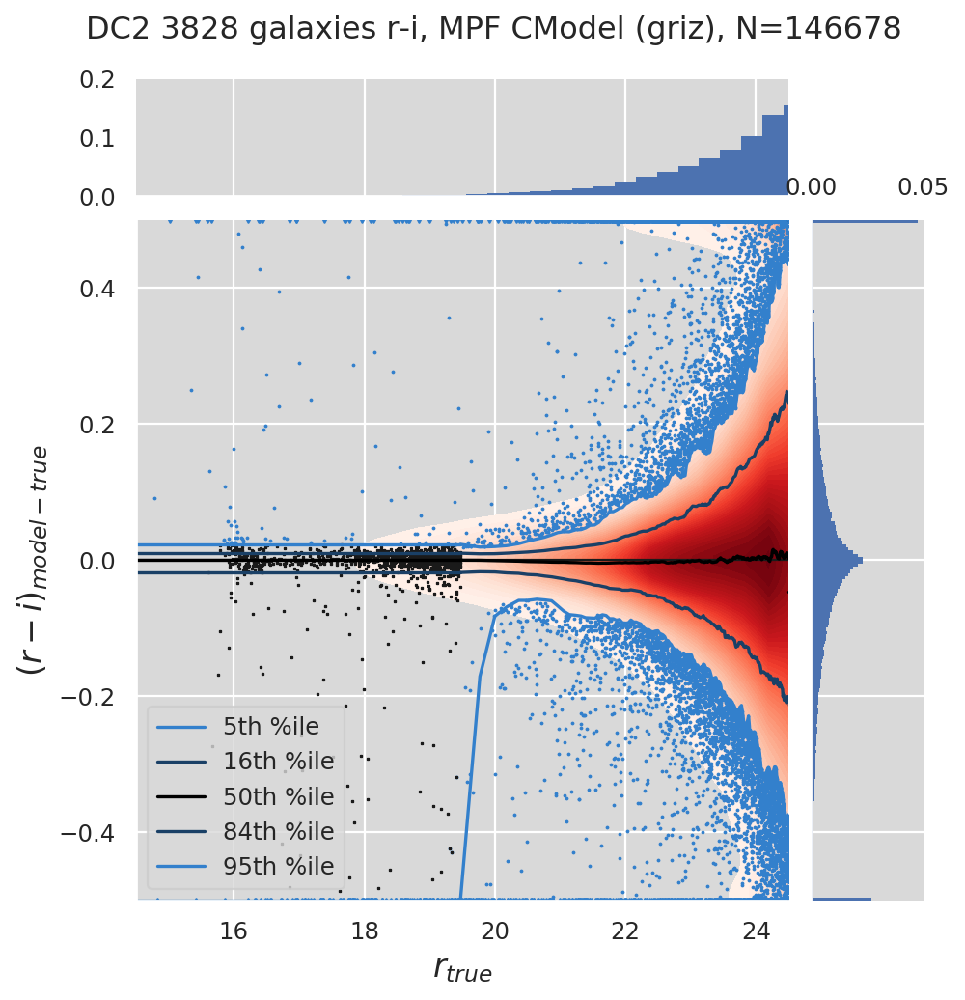

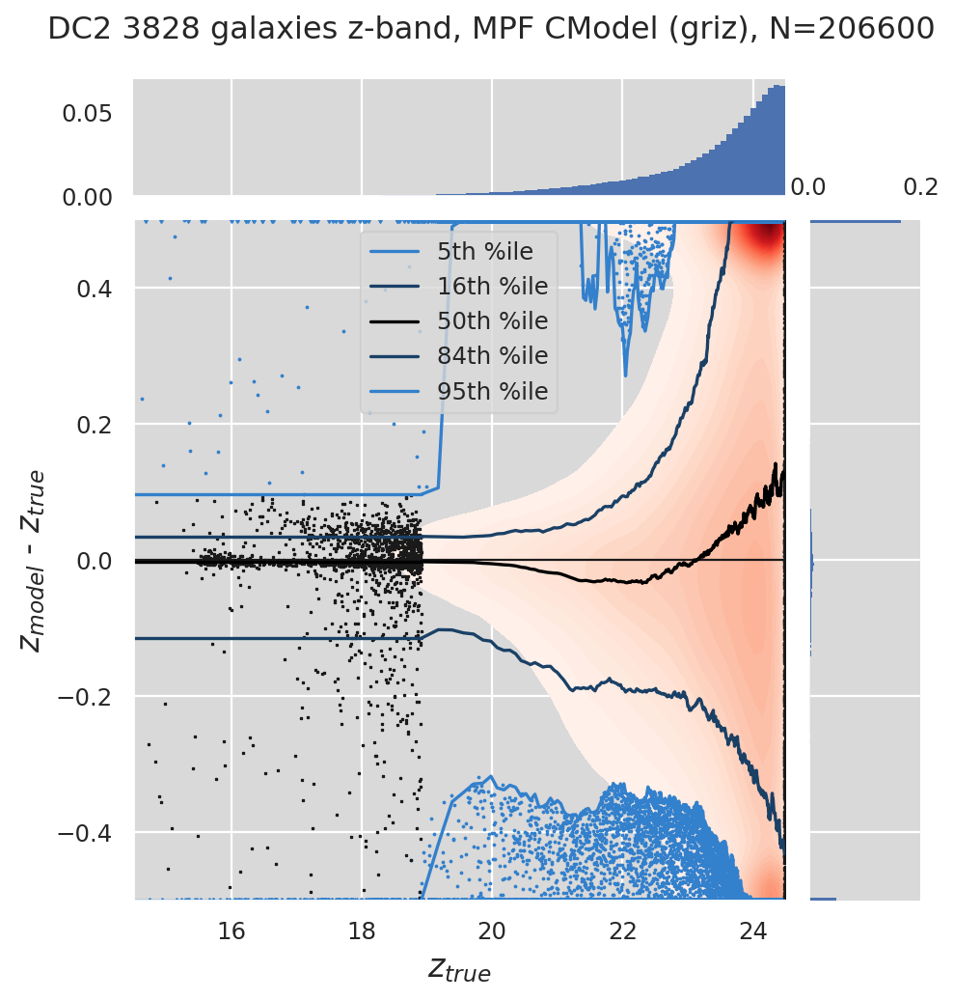

DC2 3828 galaxies i-z, MPF CModel (griz), N=206600 733731 733731 733731
Tract 3828 has 732330 resolved sources and 6269 unresolved (MPF Sersic=multiprofit_mg8serbpx size < 0.02) totalling 732084 good sources
DC2 3828 galaxies g-band, MPF Sersic (griz), N=62355


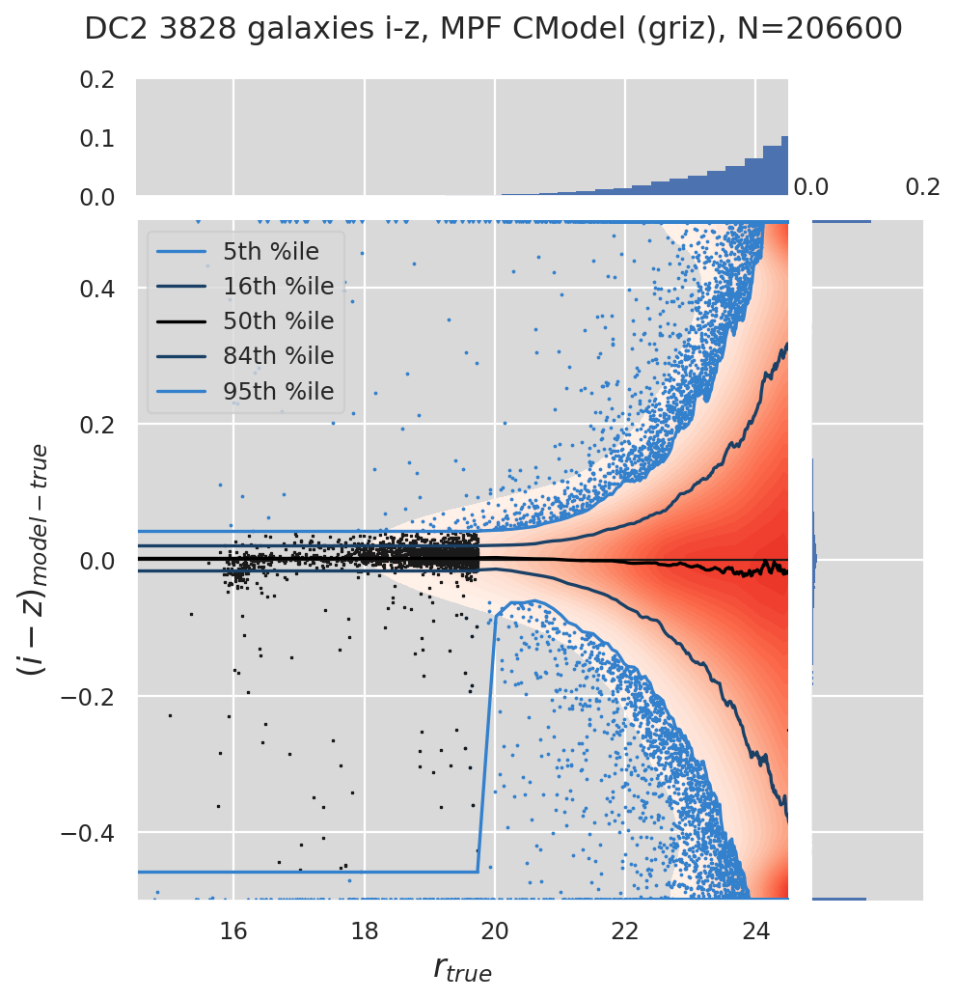

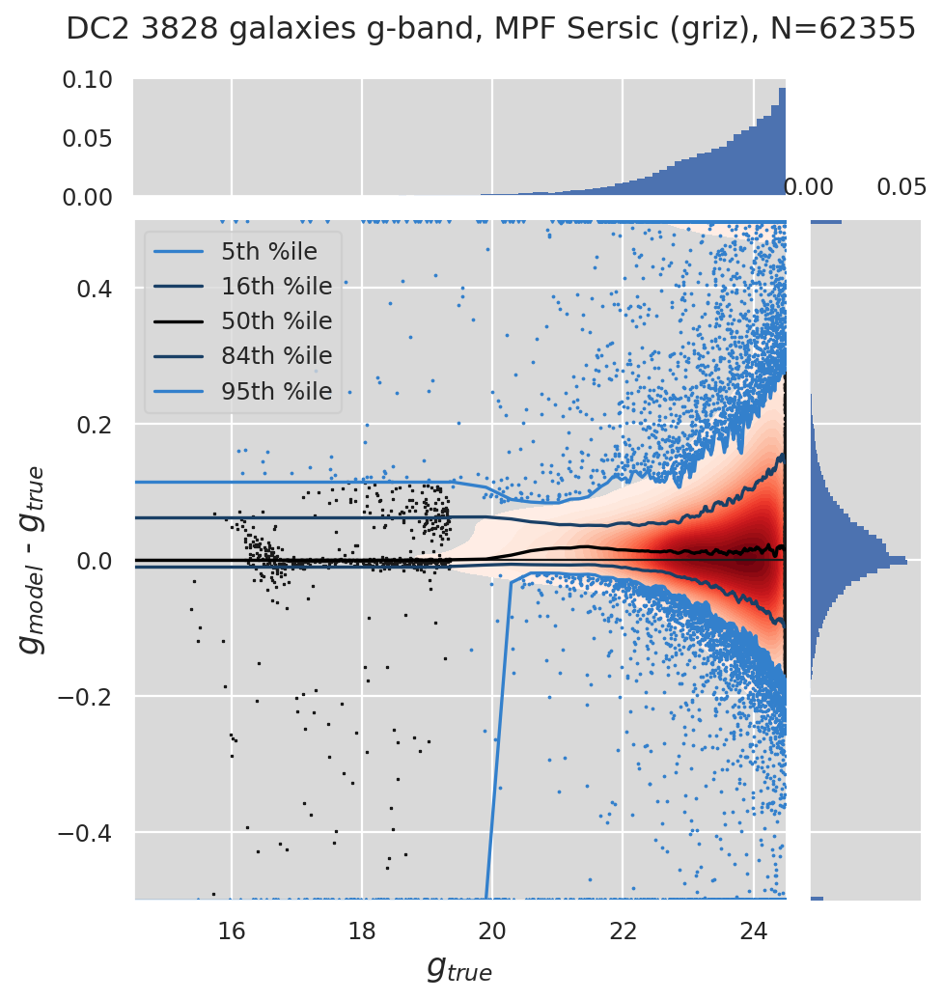

DC2 3828 galaxies r-band, MPF Sersic (griz), N=95298


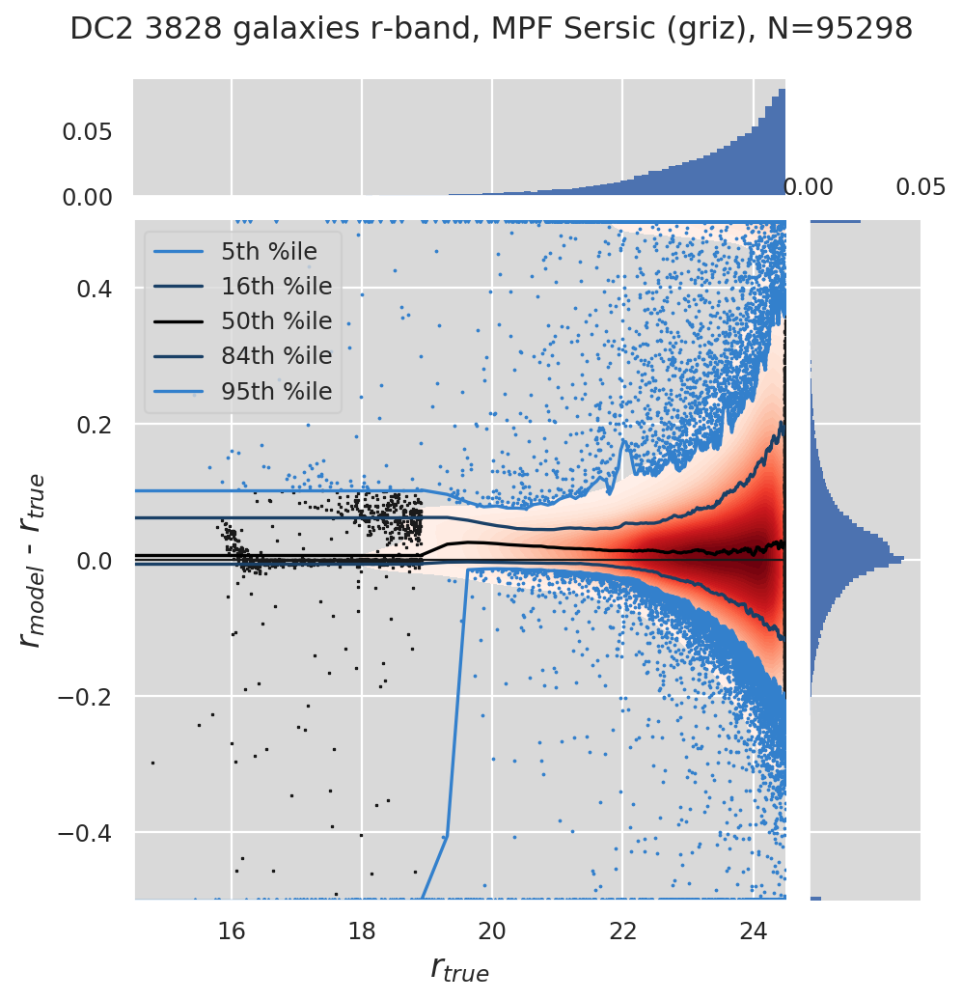

DC2 3828 galaxies g-r, MPF Sersic (griz), N=95298 732084 732084 732084
DC2 3828 galaxies i-band, MPF Sersic (griz), N=145845


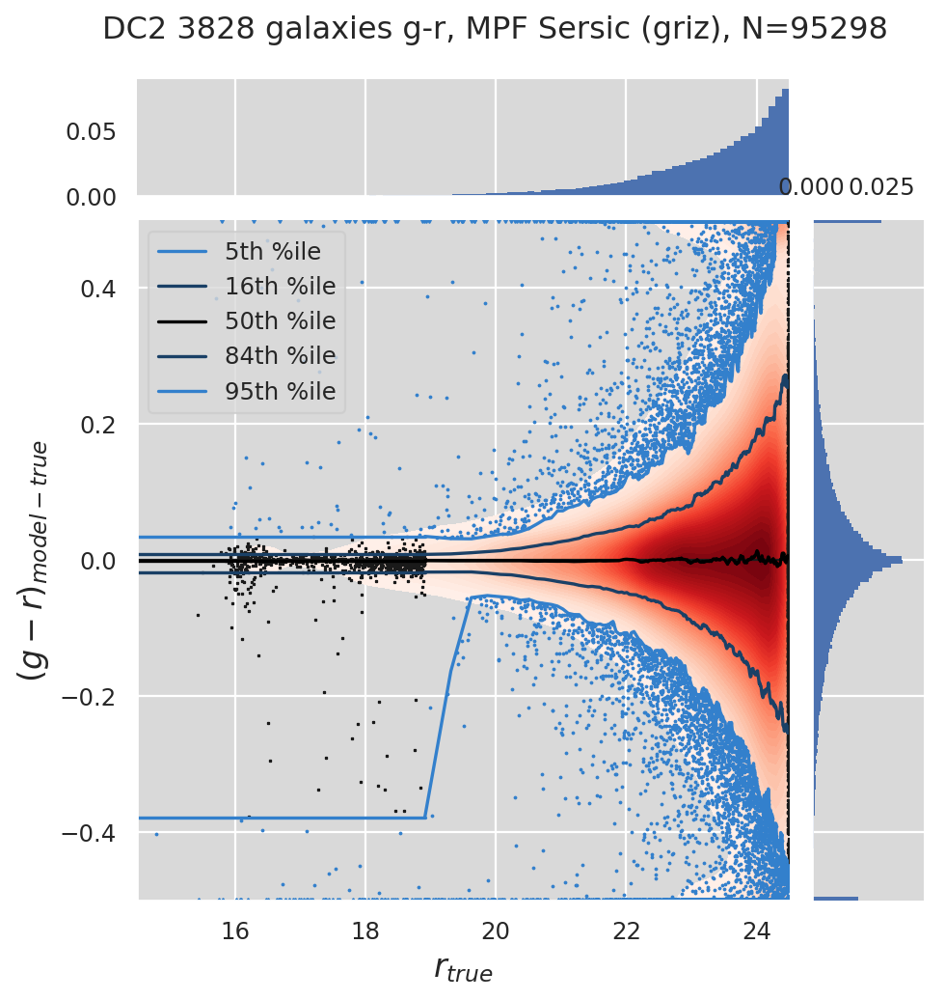

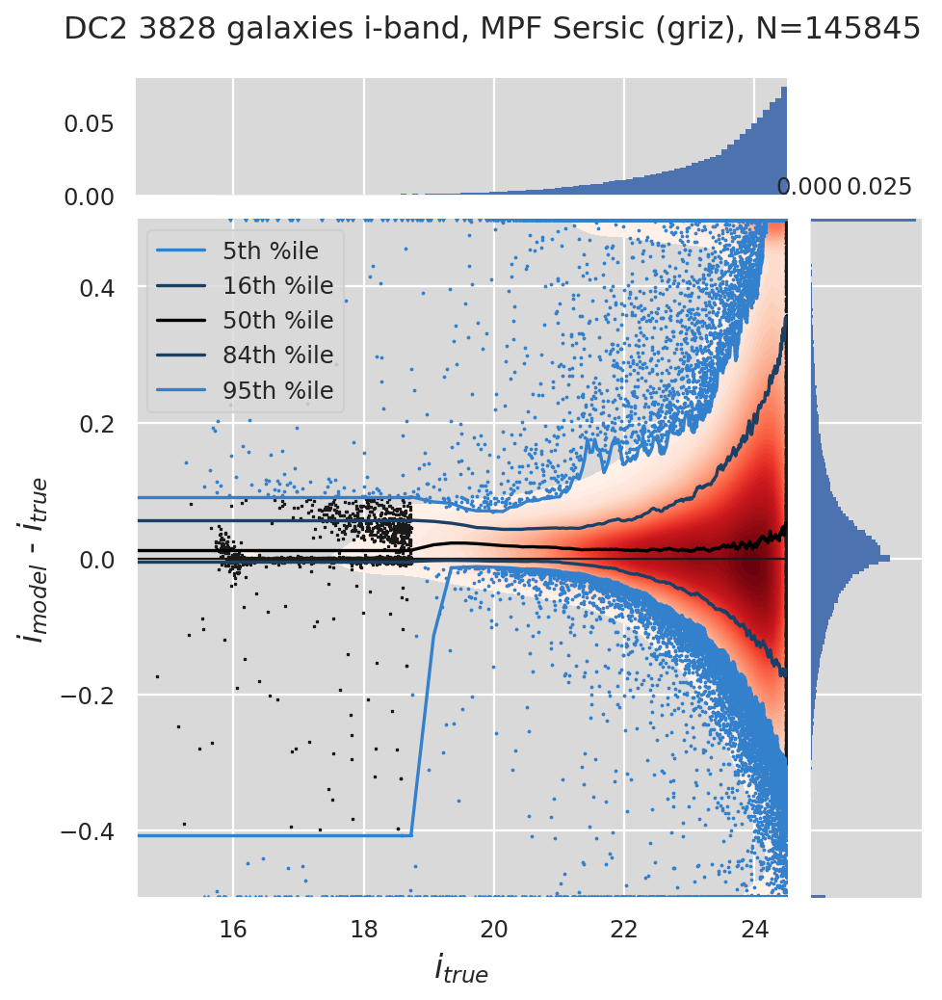

DC2 3828 galaxies r-i, MPF Sersic (griz), N=145845 732084 732084 732084
DC2 3828 galaxies z-band, MPF Sersic (griz), N=206703


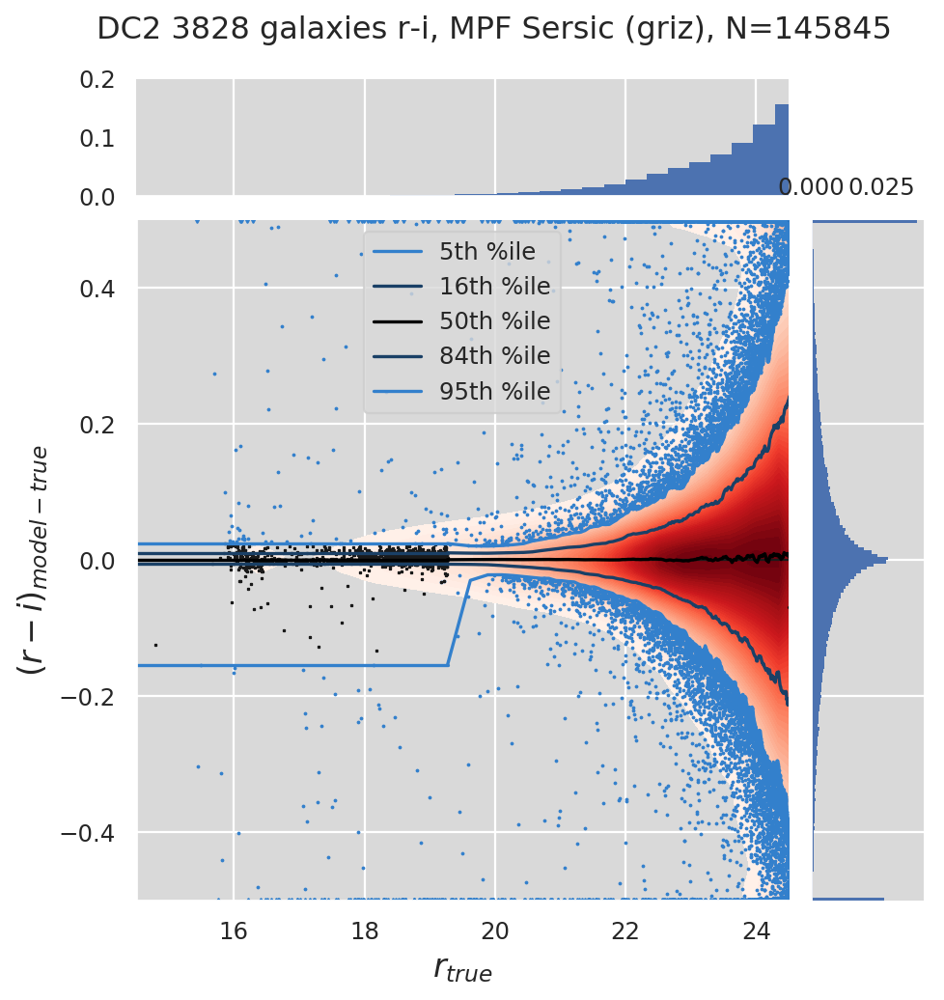

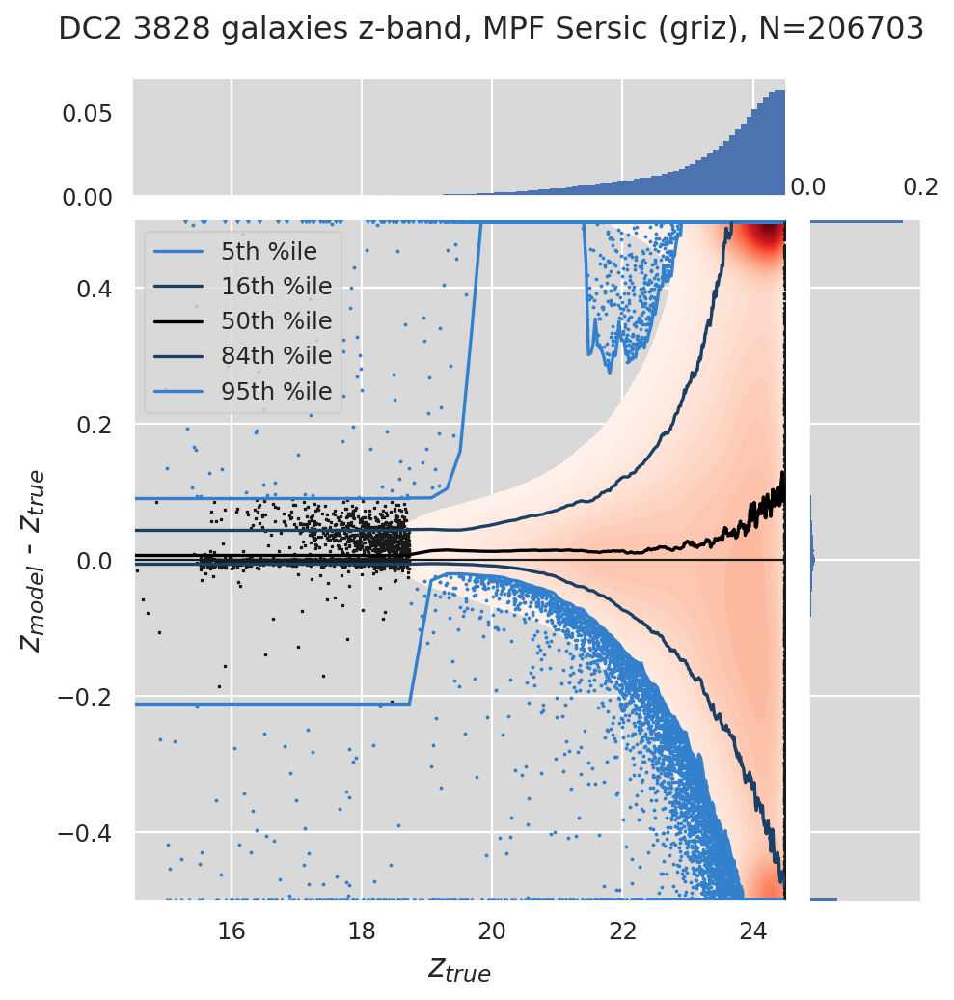

DC2 3828 galaxies i-z, MPF Sersic (griz), N=206703 732084 732084 732084
Tract 3828 has 732330 resolved sources and 6269 unresolved (MPF Sersic Free Amp.=multiprofit_mg8serbapx size < 0.02) totalling 732084 good sources
DC2 3828 galaxies g-band, MPF Sersic Free Amp. (griz), N=61644


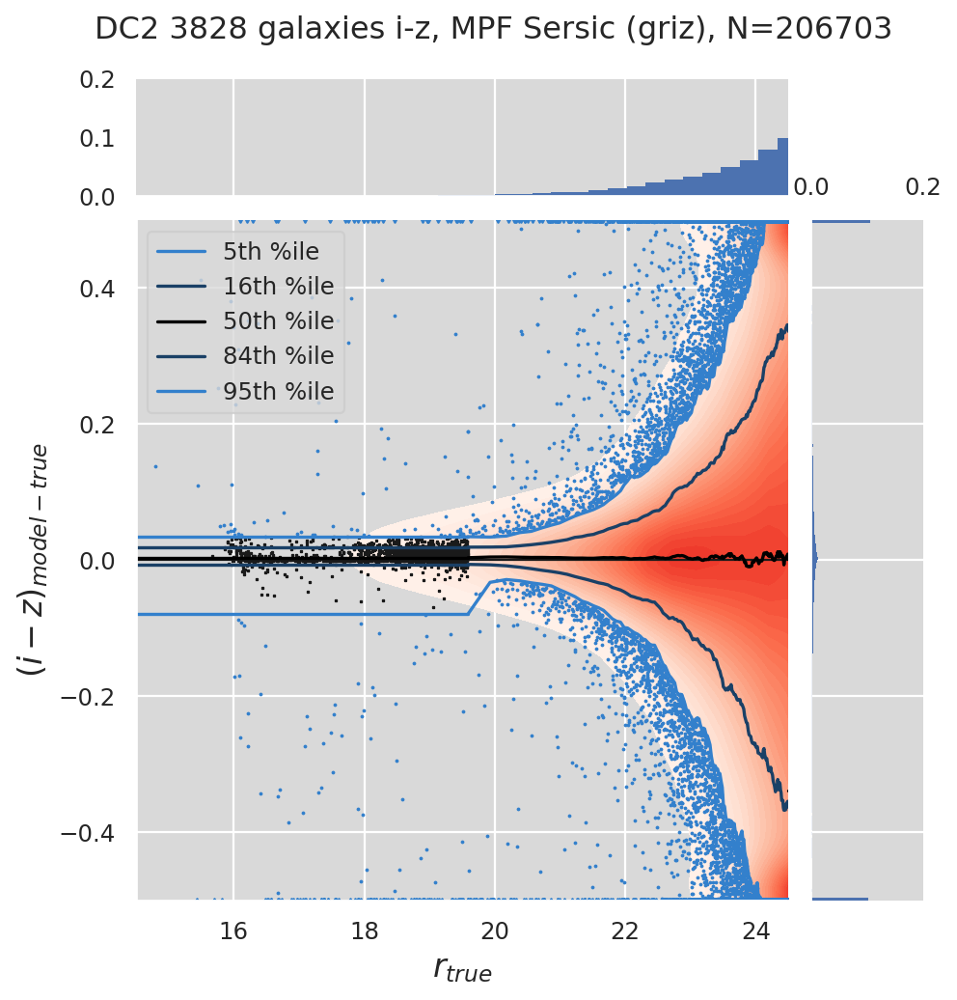

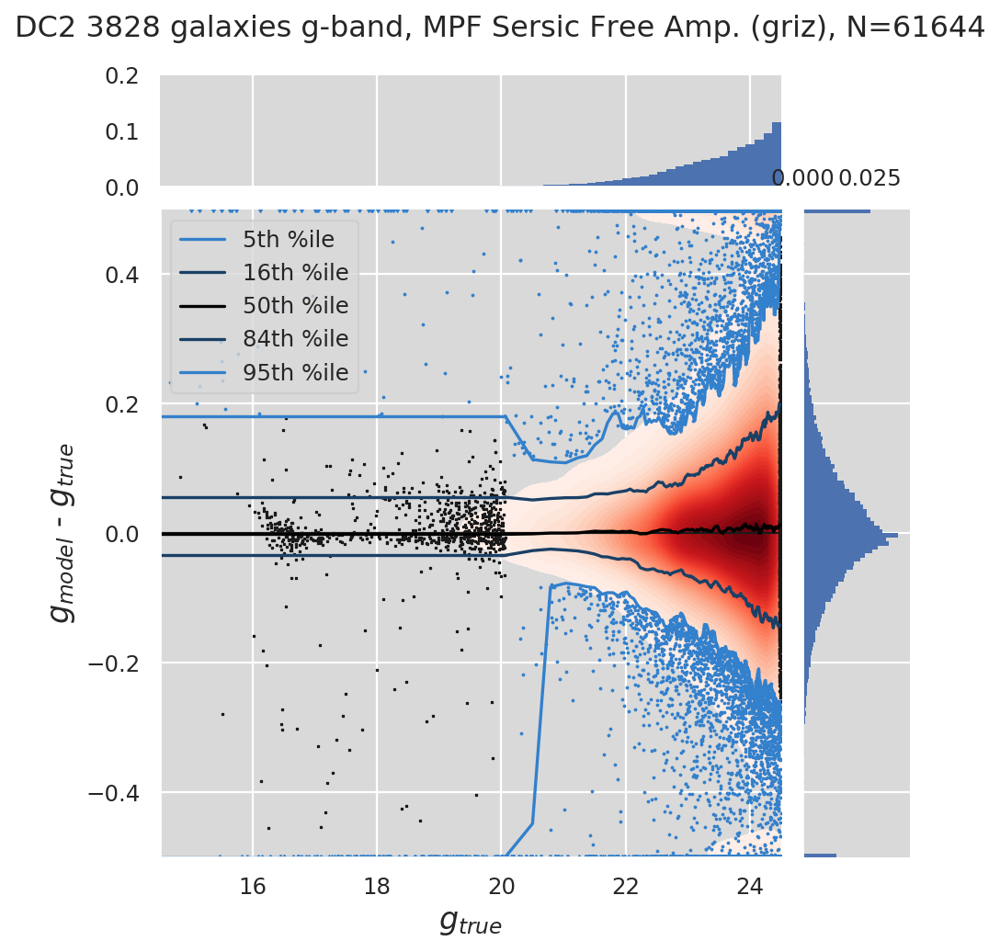

DC2 3828 galaxies r-band, MPF Sersic Free Amp. (griz), N=95575


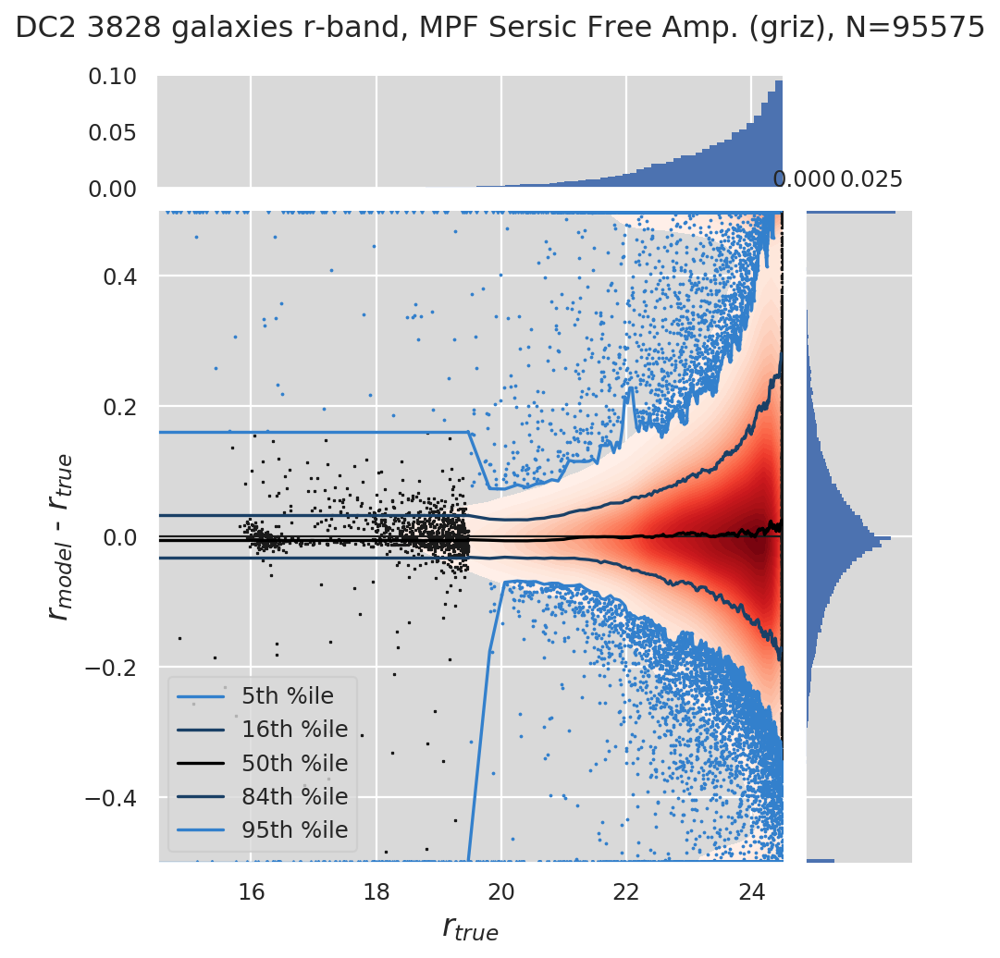

DC2 3828 galaxies g-r, MPF Sersic Free Amp. (griz), N=95575 732084 732084 732084
DC2 3828 galaxies i-band, MPF Sersic Free Amp. (griz), N=147889


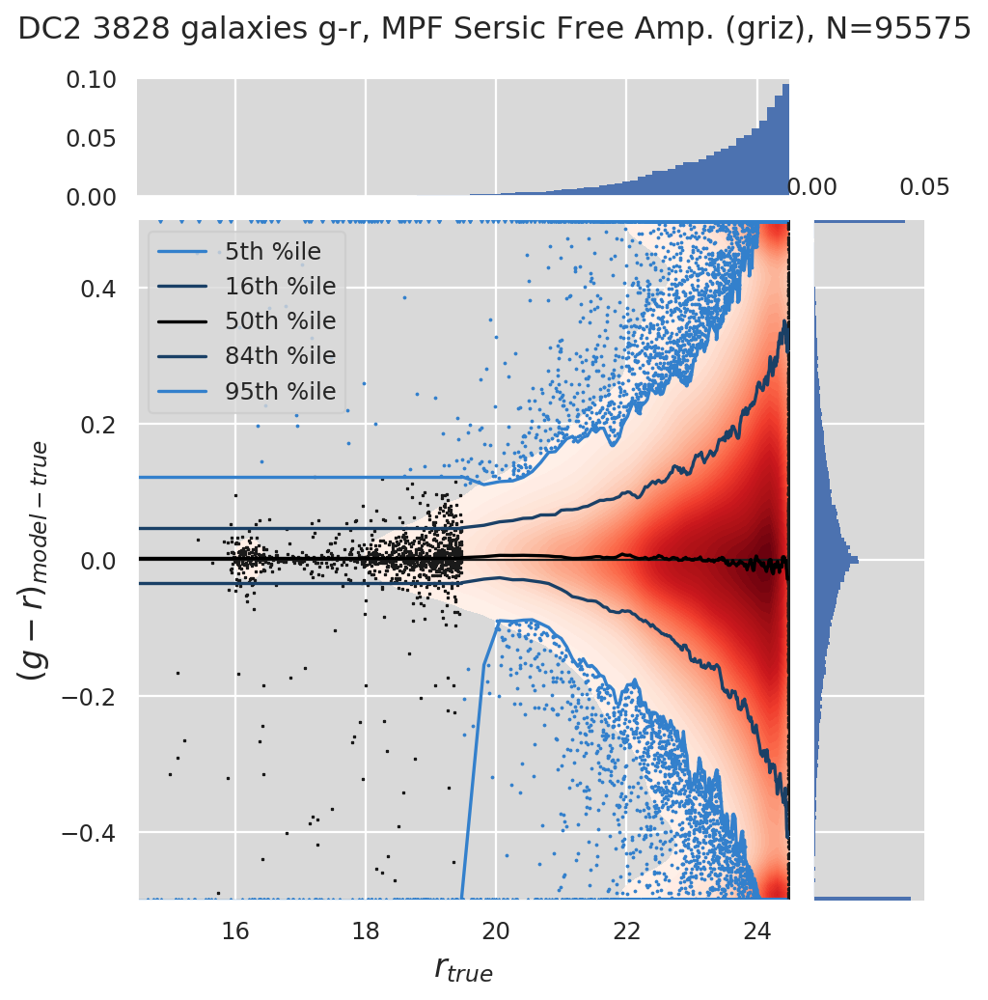

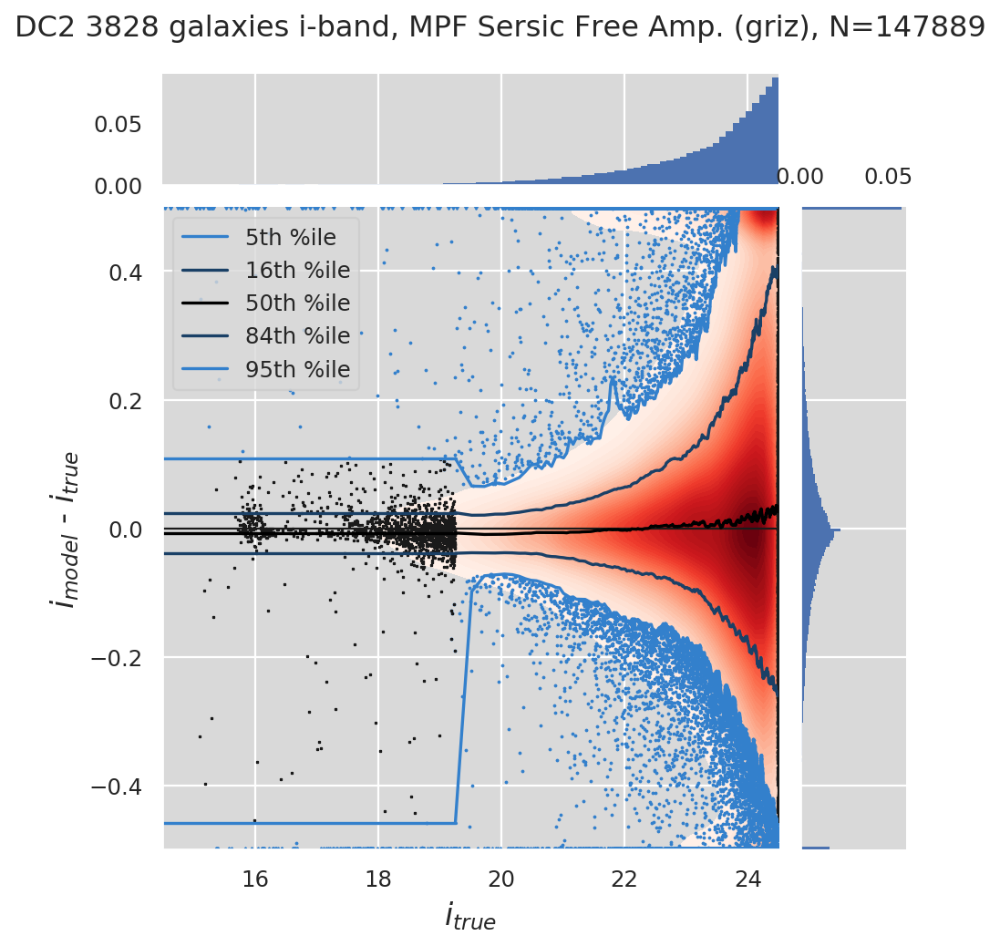

DC2 3828 galaxies r-i, MPF Sersic Free Amp. (griz), N=147889 732084 732084 732084
DC2 3828 galaxies z-band, MPF Sersic Free Amp. (griz), N=208051


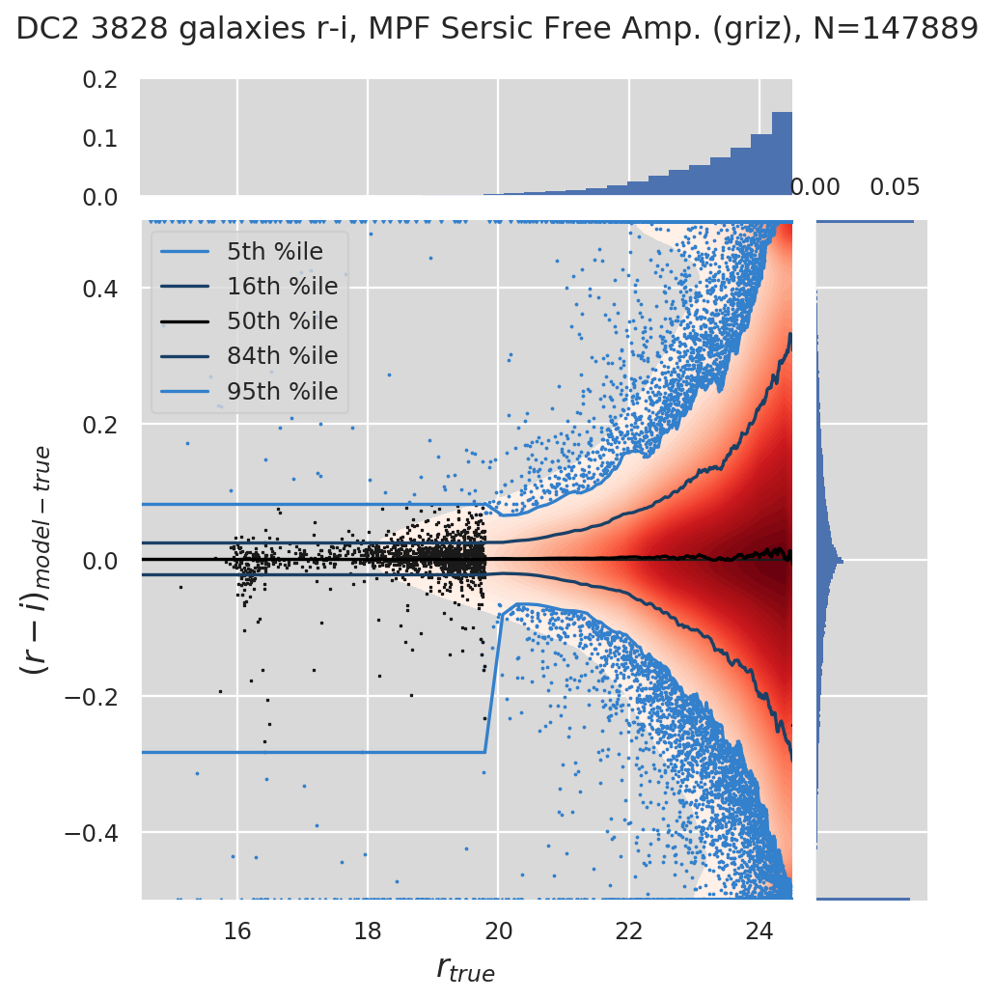

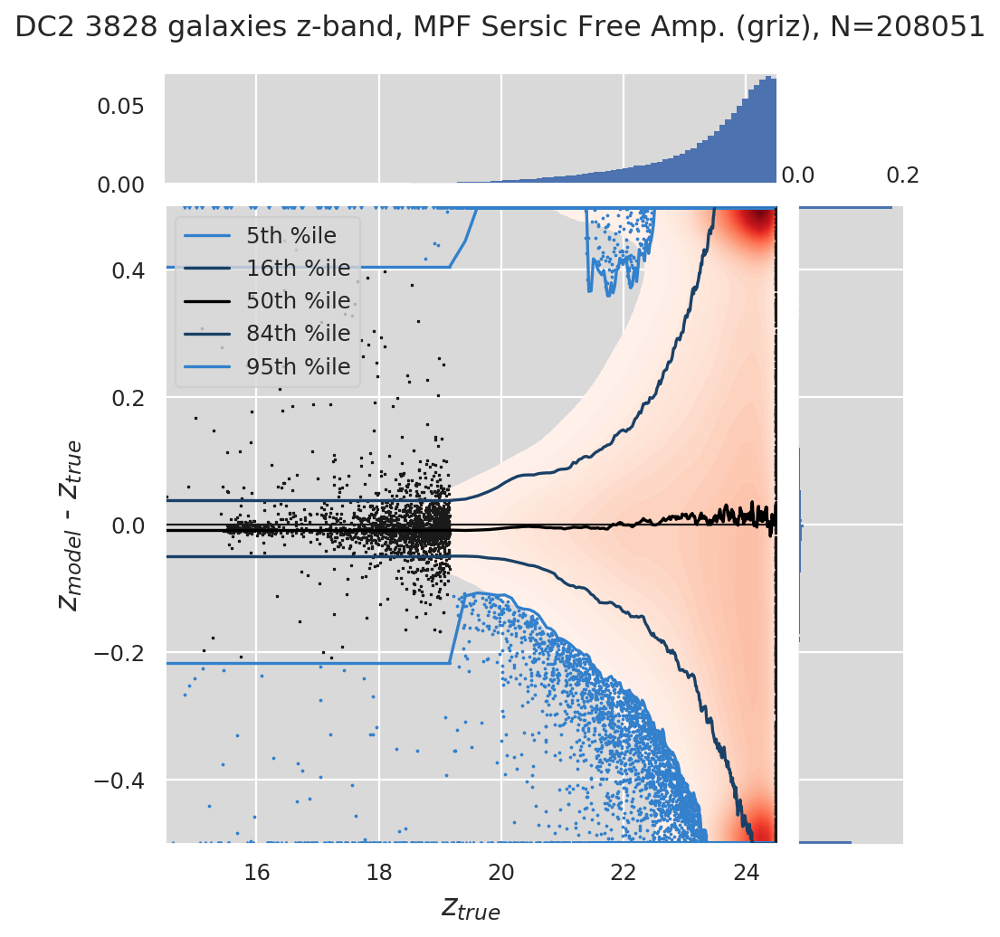

DC2 3828 galaxies i-z, MPF Sersic Free Amp. (griz), N=208051 732084 732084 732084


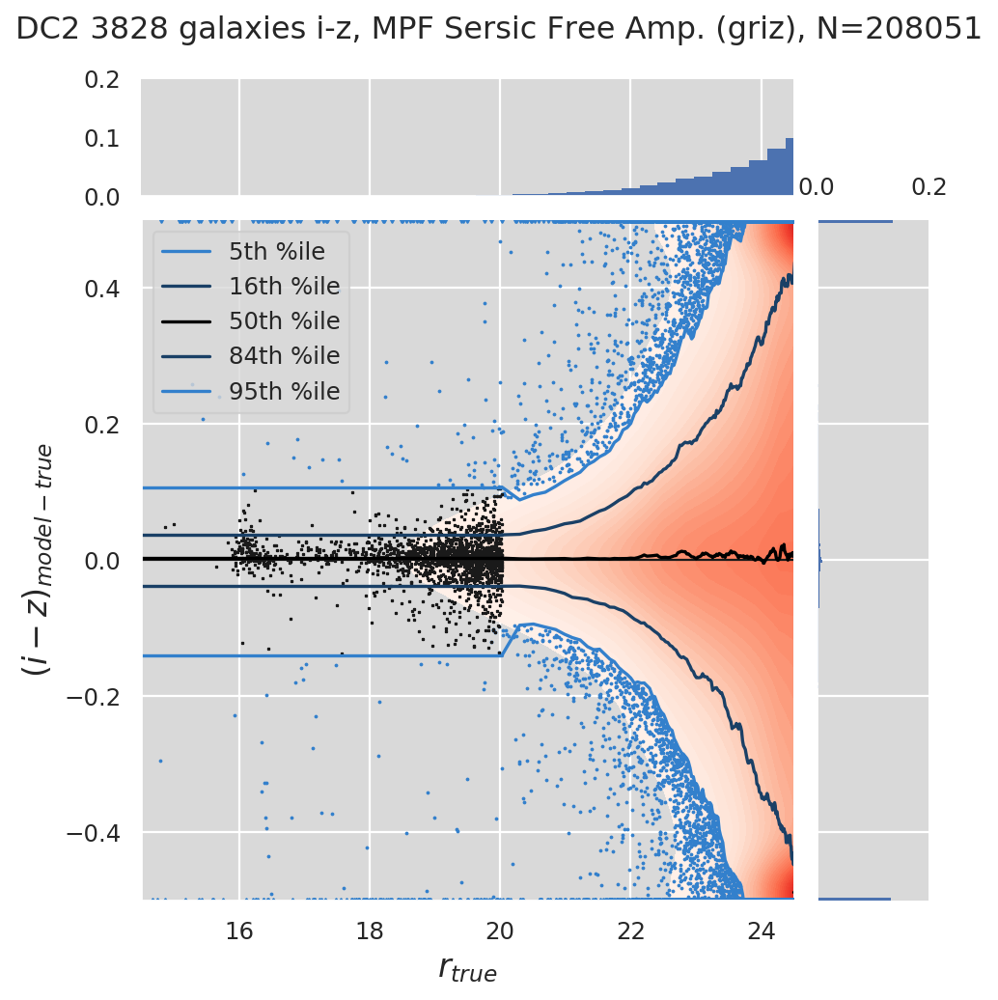

In [10]:
# Galaxies
plot_models(models, cats, cats_orig, band_multi, band_multi, is_galaxies=True, args_all=args, args_type=args_type['resolved'])

## Point source fluxes and colours

There's not much to say here, other than that the stars look basically fine up to the saturation limit of ~16 and the choice of PSF/source model and single- vs multi-band fitting makes little difference. Someone more versed in stellar photometry might have more to say about the small biases in the medians, outliers, etc.

Tract 3828 has 733311 resolved sources and 5288 unresolved (MPF Gauss=multiprofit_gausspx size < 0.02) totalling 2100 good sources
DC2 3828 stars g-band, MPF Gauss (griz), N=1004


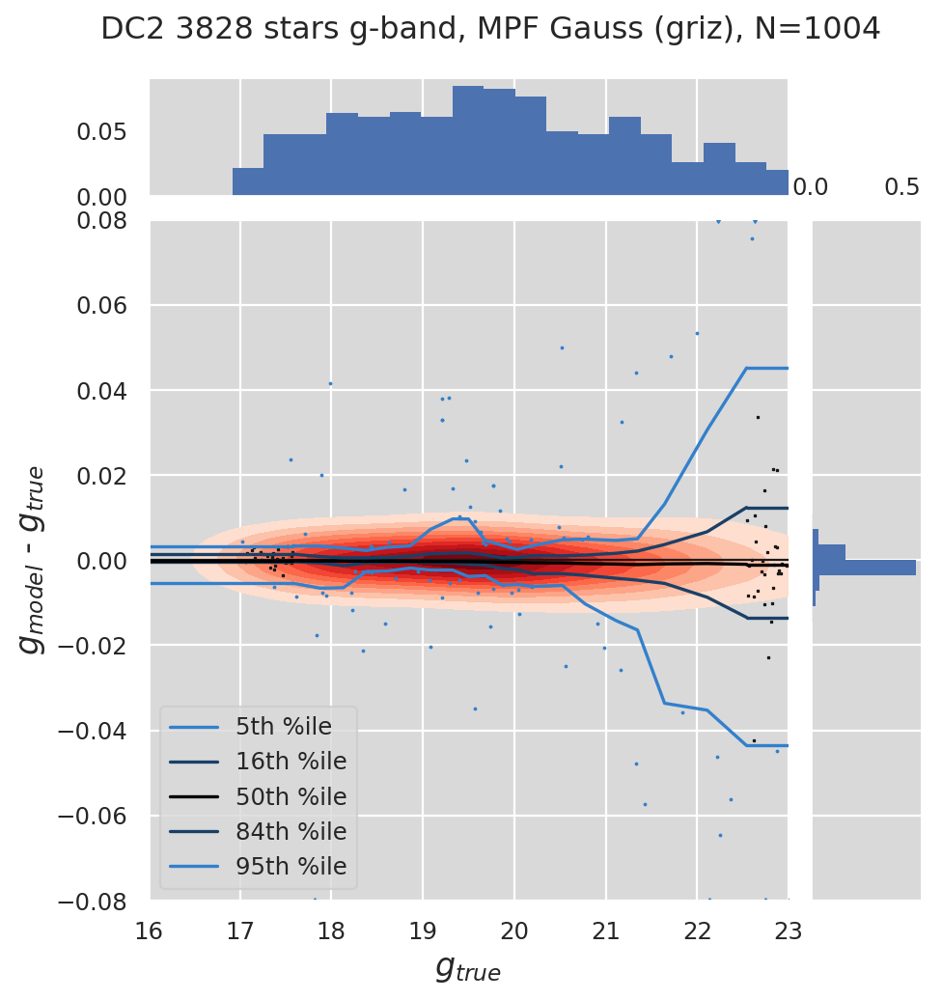

DC2 3828 stars r-band, MPF Gauss (griz), N=1043


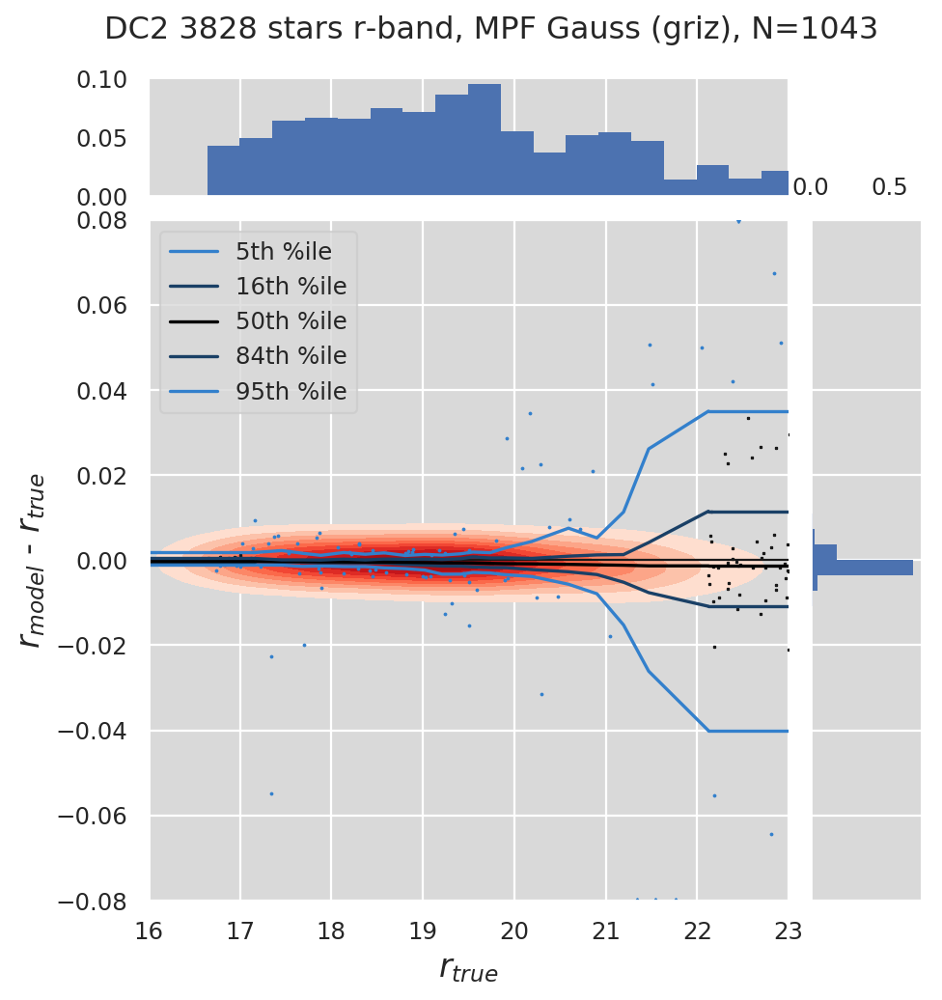

DC2 3828 stars g-r, MPF Gauss (griz), N=1043 2100 2100 2100
DC2 3828 stars i-band, MPF Gauss (griz), N=1053


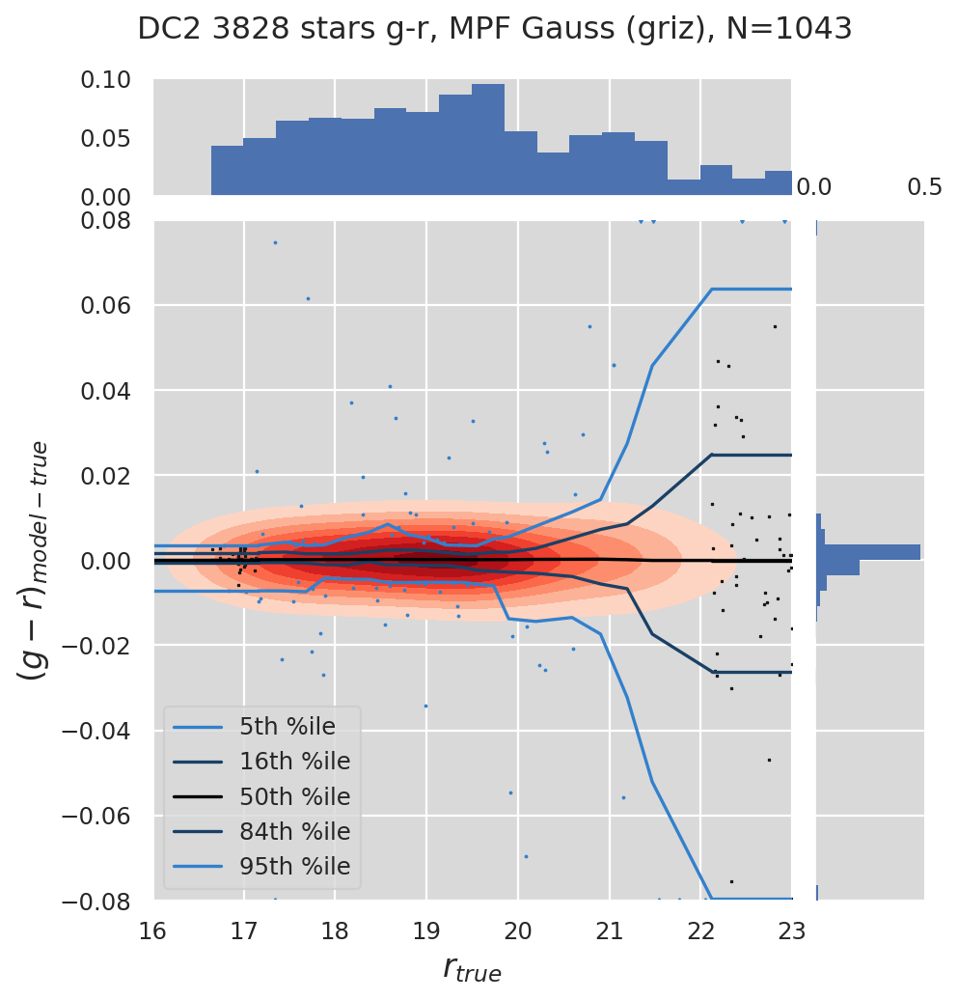

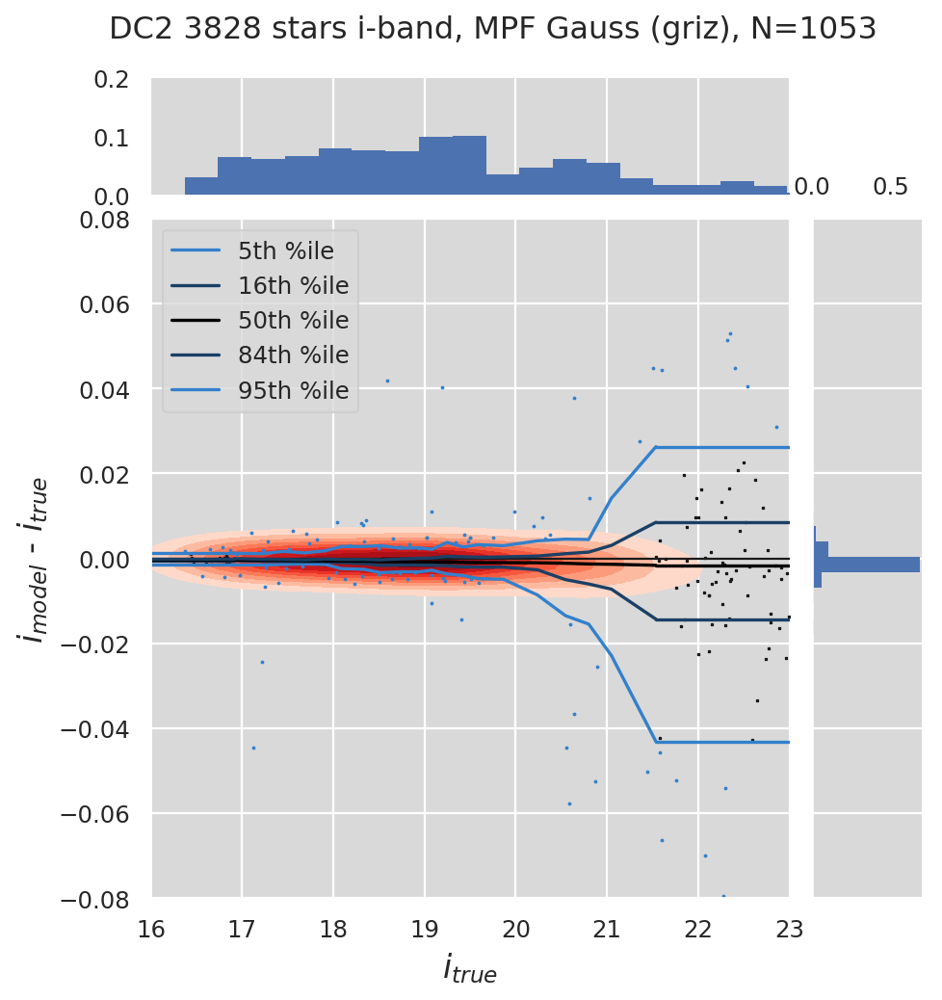

DC2 3828 stars r-i, MPF Gauss (griz), N=1053 2100 2100 2100
DC2 3828 stars z-band, MPF Gauss (griz), N=1055


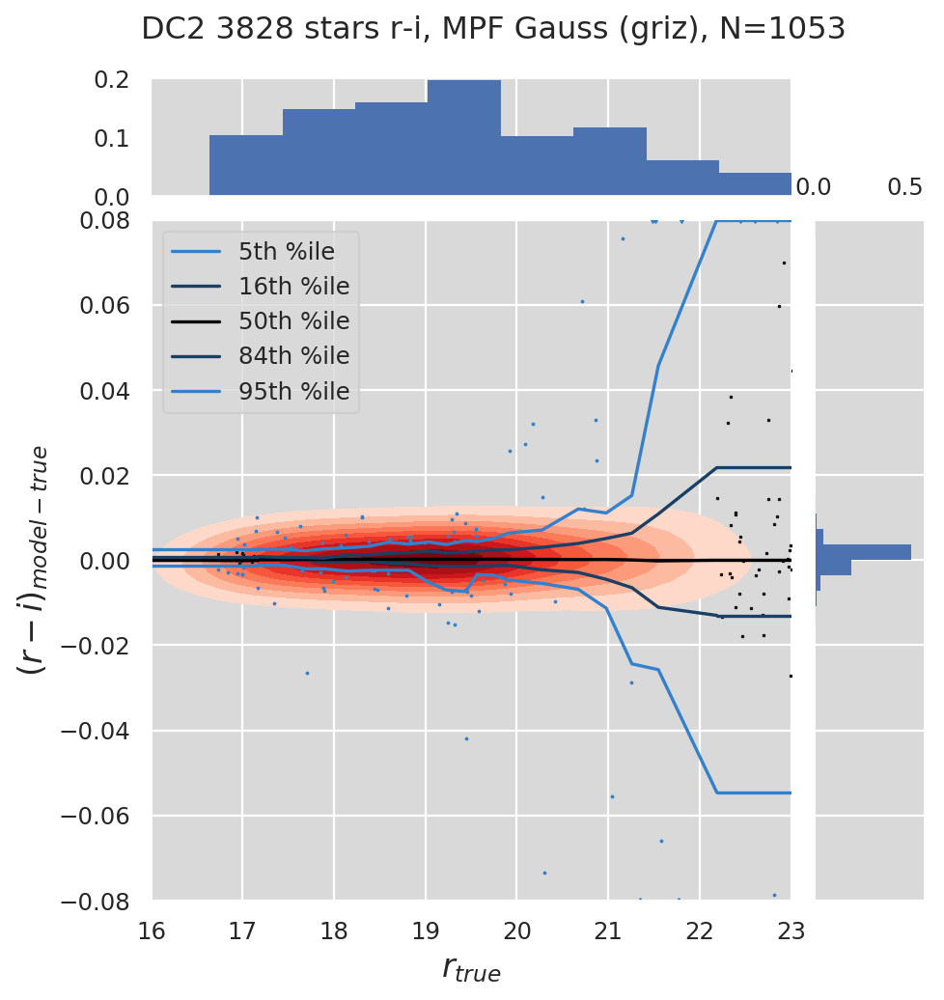

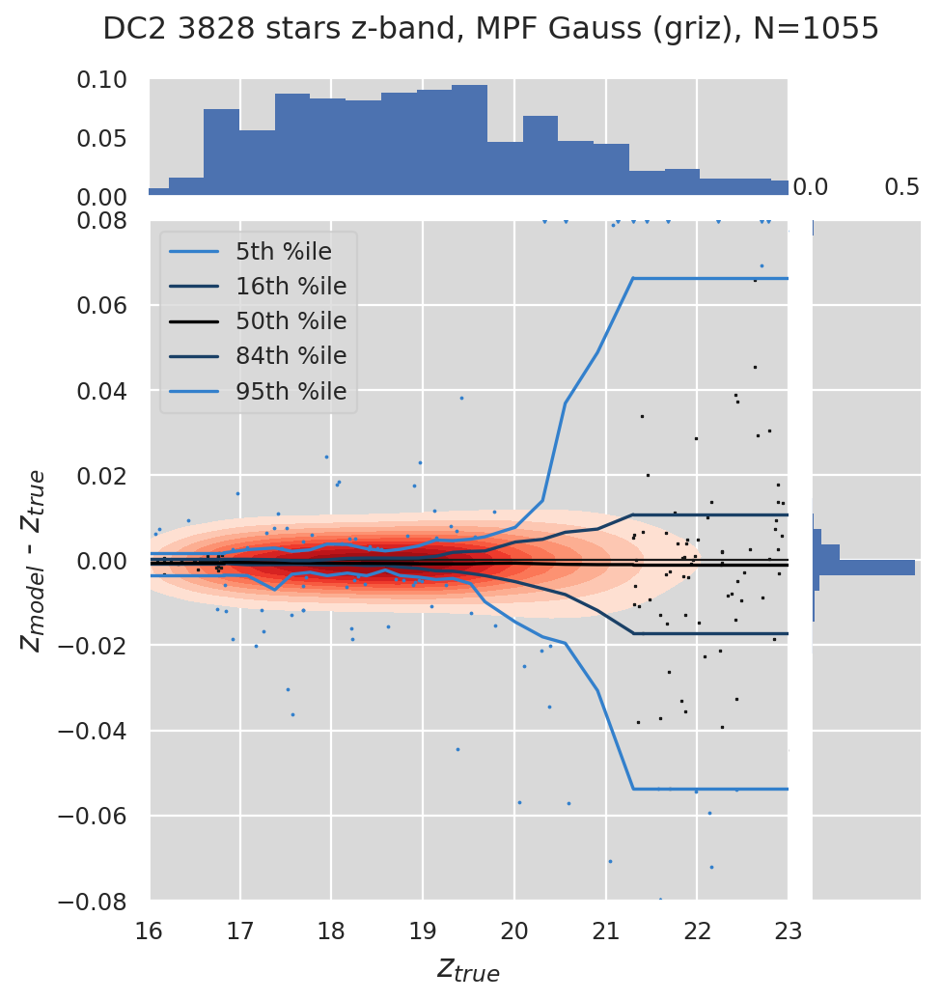

DC2 3828 stars i-z, MPF Gauss (griz), N=1055 2100 2100 2100
Tract 3828 has 733976 resolved sources and 4623 unresolved (MPF CModel=multiprofit_mg8cmodelpx size < 0.02) totalling 1435 good sources
DC2 3828 stars g-band, MPF CModel (griz), N=92


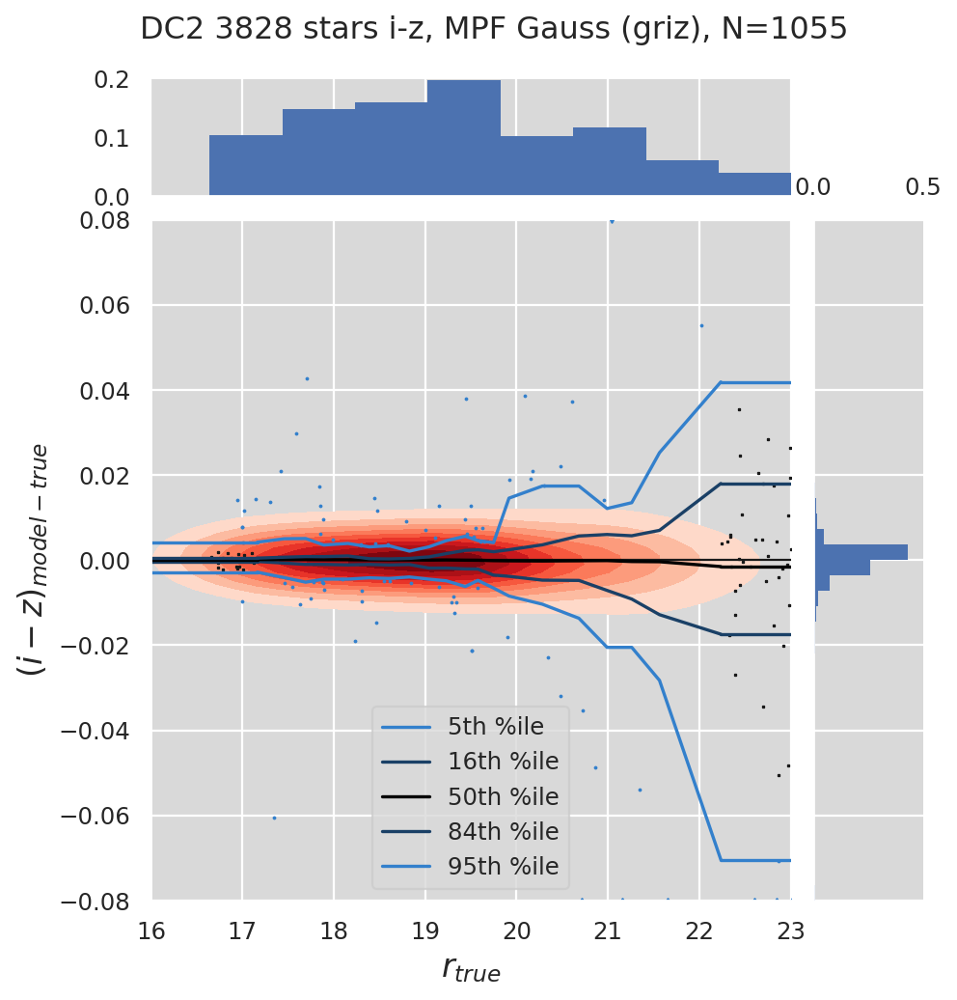

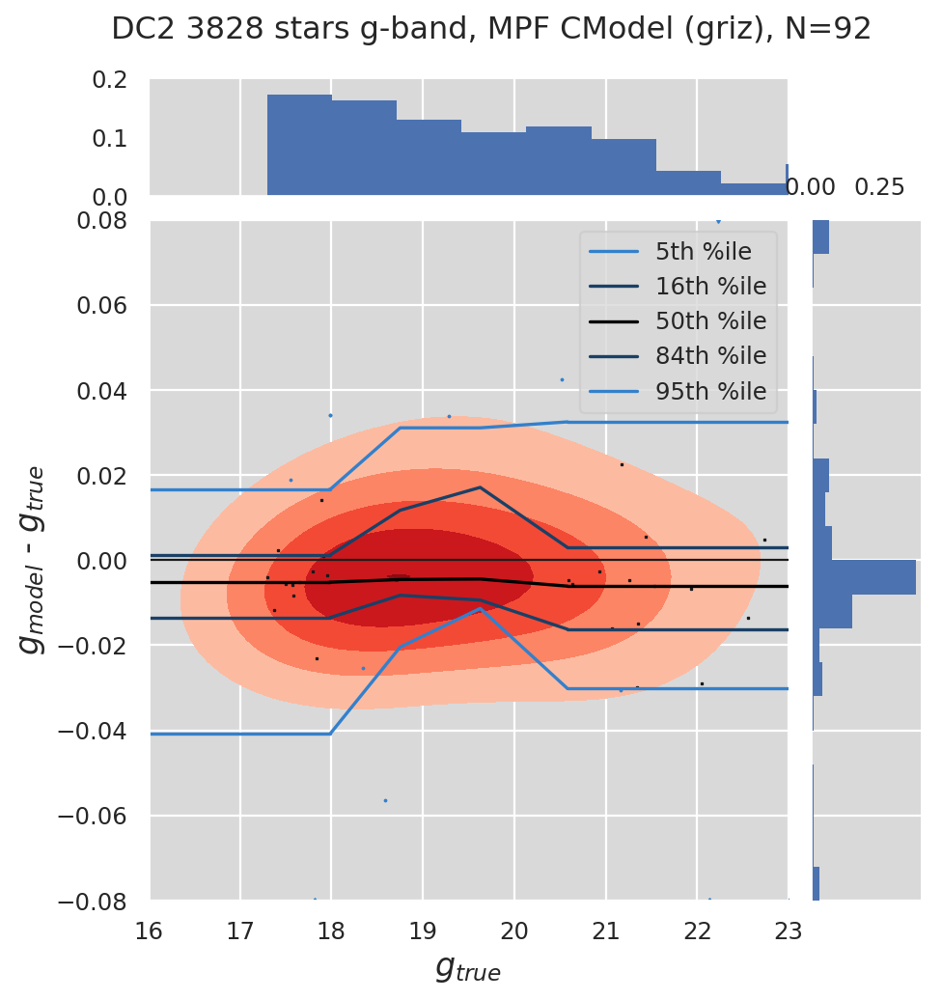

DC2 3828 stars r-band, MPF CModel (griz), N=95


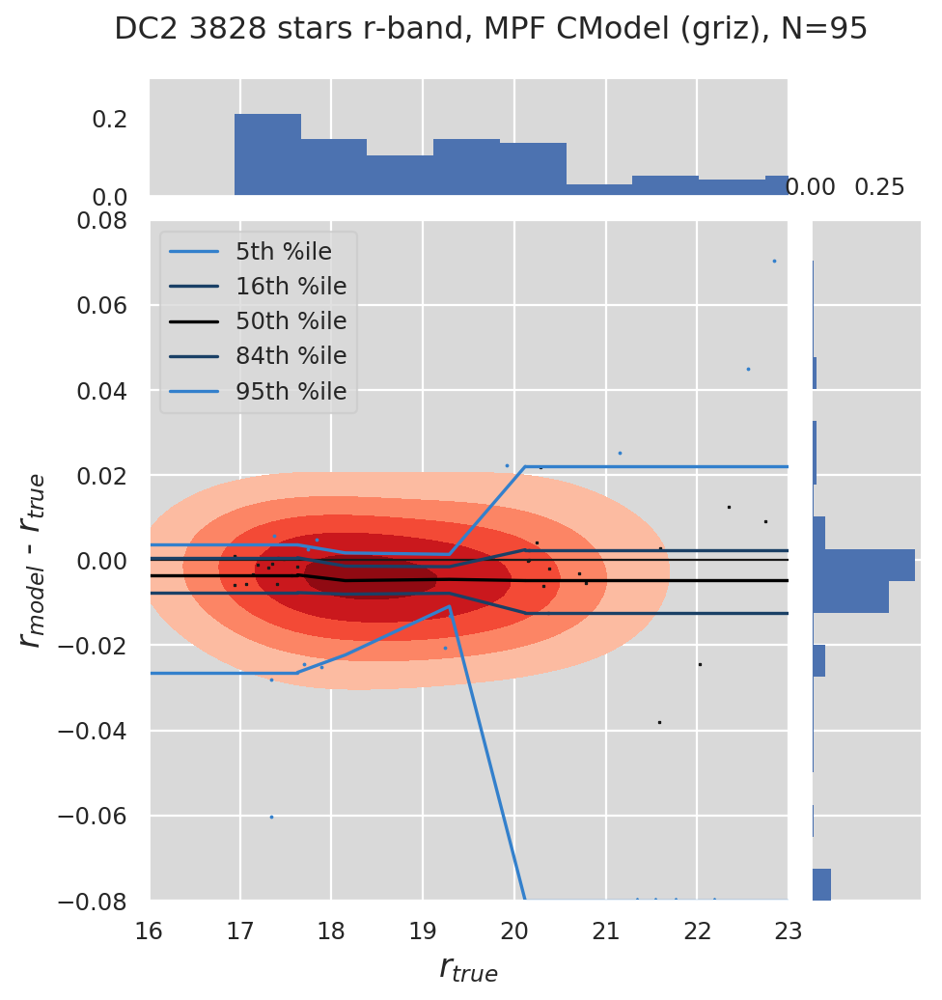

DC2 3828 stars g-r, MPF CModel (griz), N=95 1435 1435 1435
DC2 3828 stars i-band, MPF CModel (griz), N=98


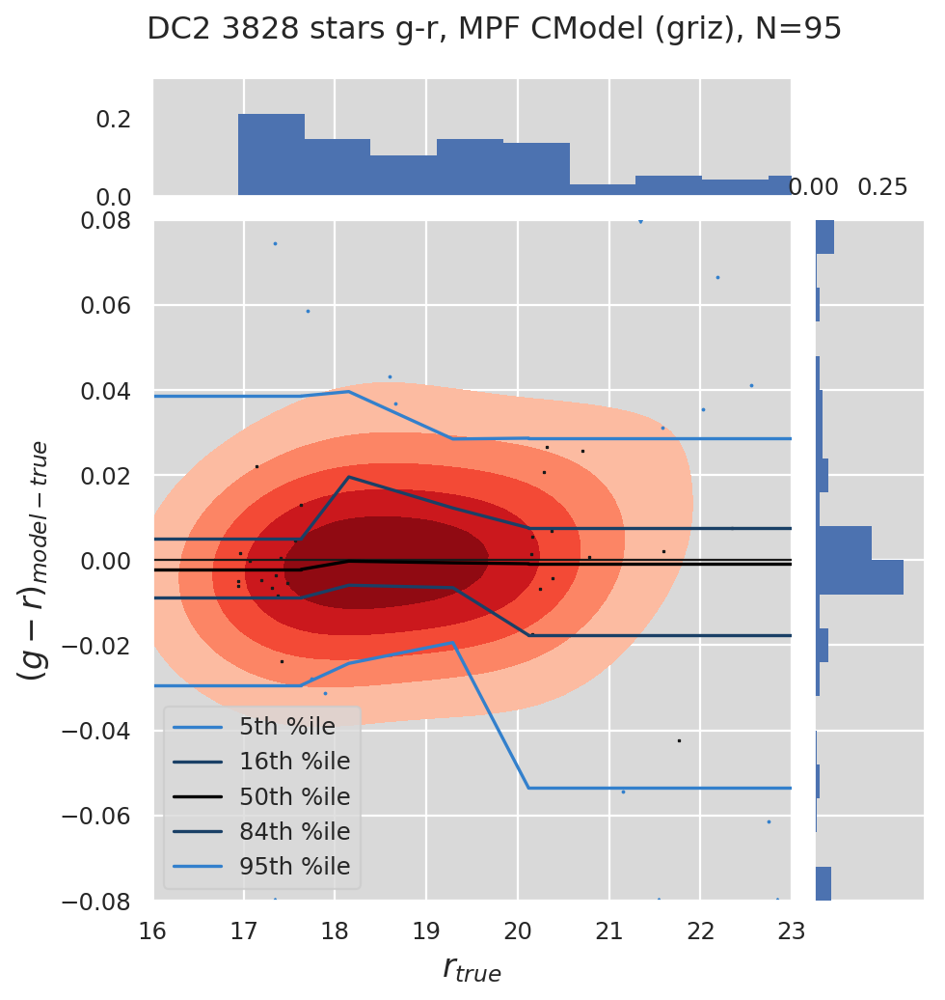

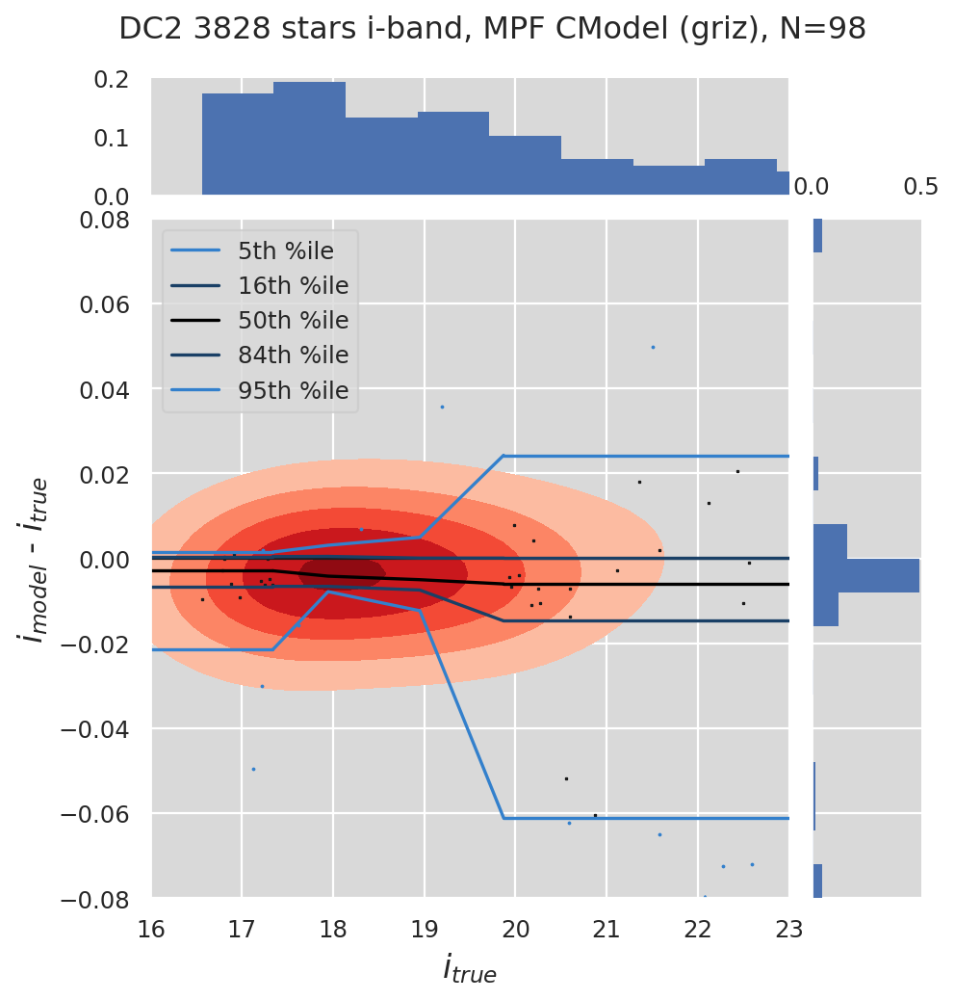

DC2 3828 stars r-i, MPF CModel (griz), N=98 1435 1435 1435
DC2 3828 stars z-band, MPF CModel (griz), N=144


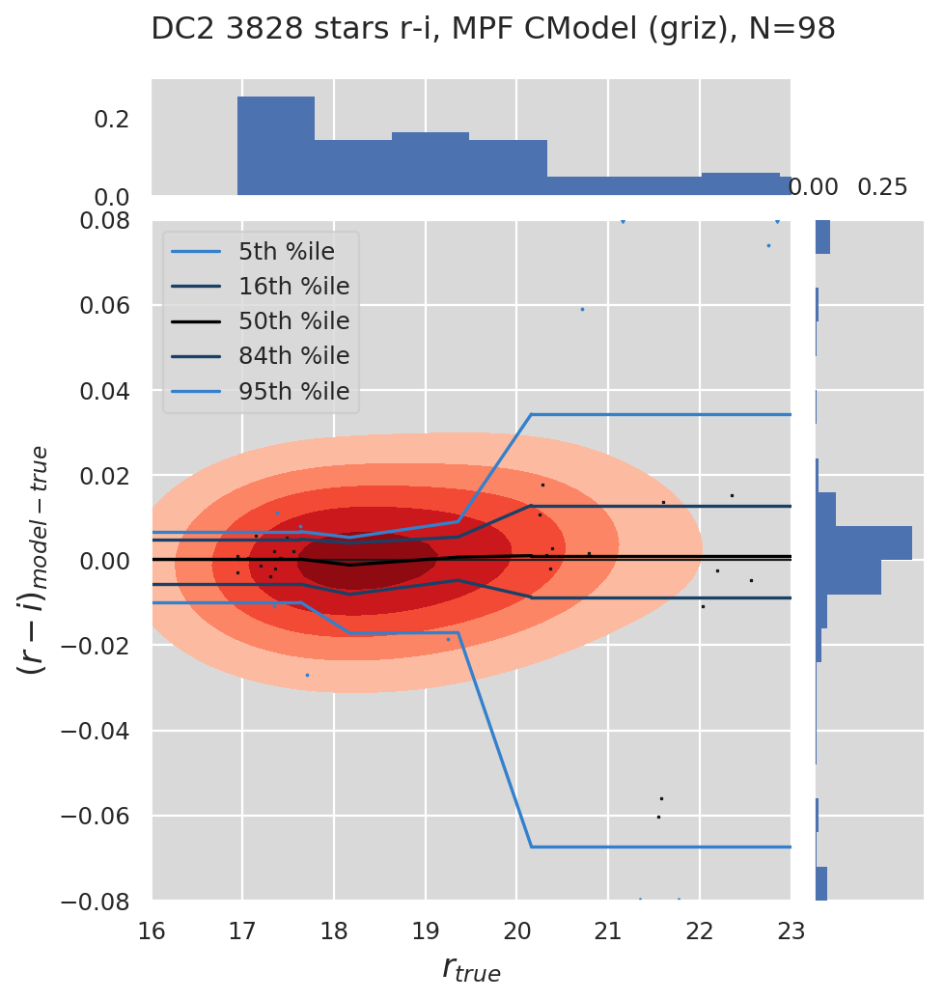

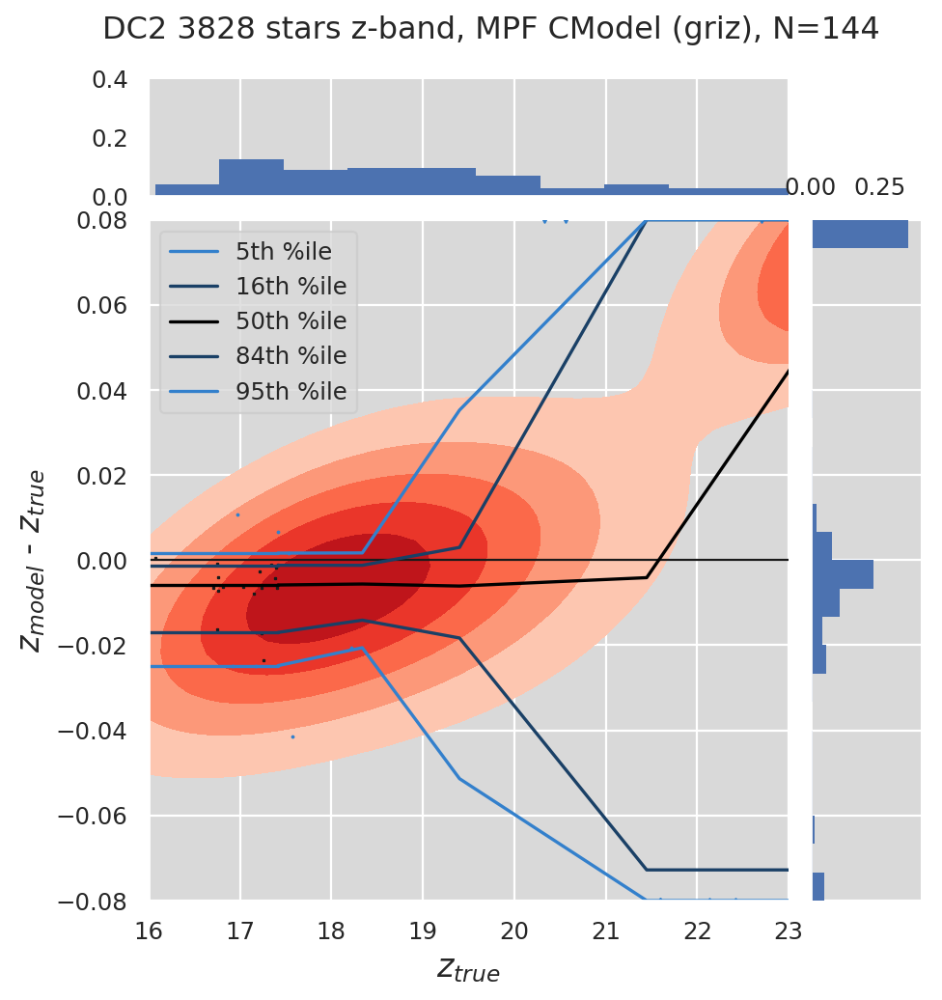

DC2 3828 stars i-z, MPF CModel (griz), N=144 1435 1435 1435
Tract 3828 has 732330 resolved sources and 6269 unresolved (MPF Sersic=multiprofit_mg8serbpx size < 0.02) totalling 3082 good sources
DC2 3828 stars g-band, MPF Sersic (griz), N=981


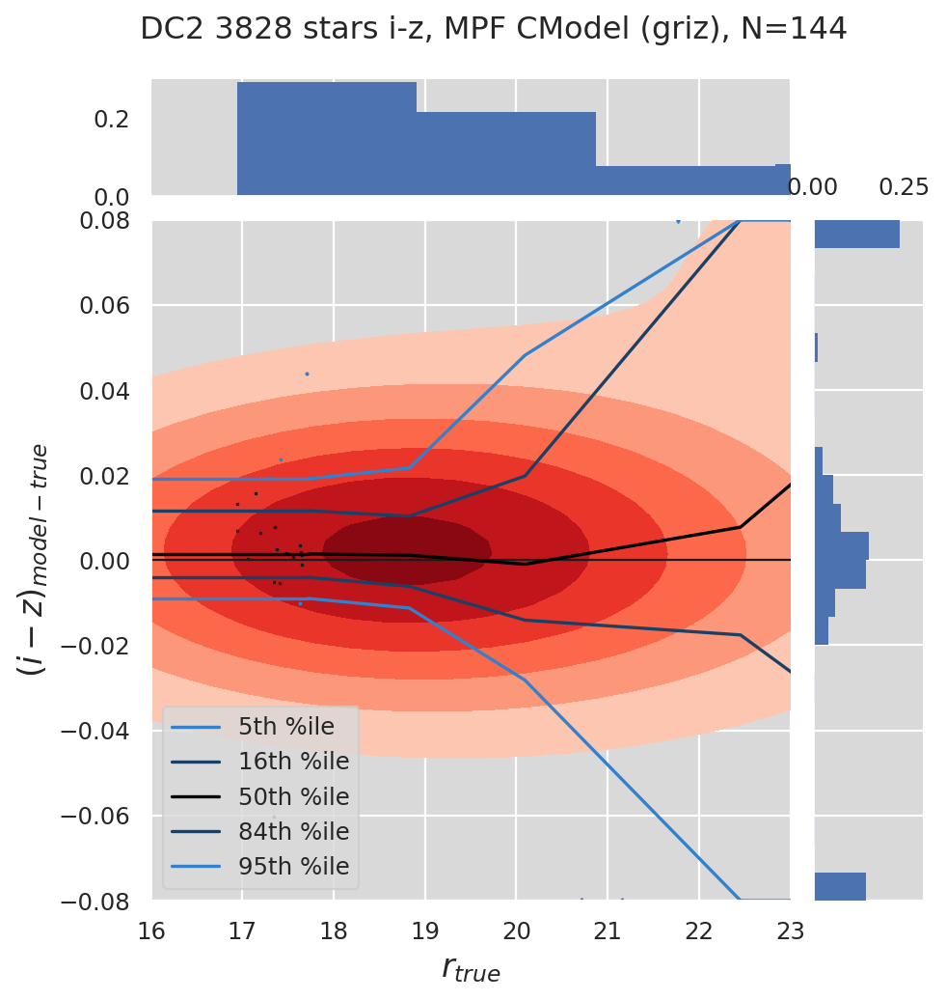

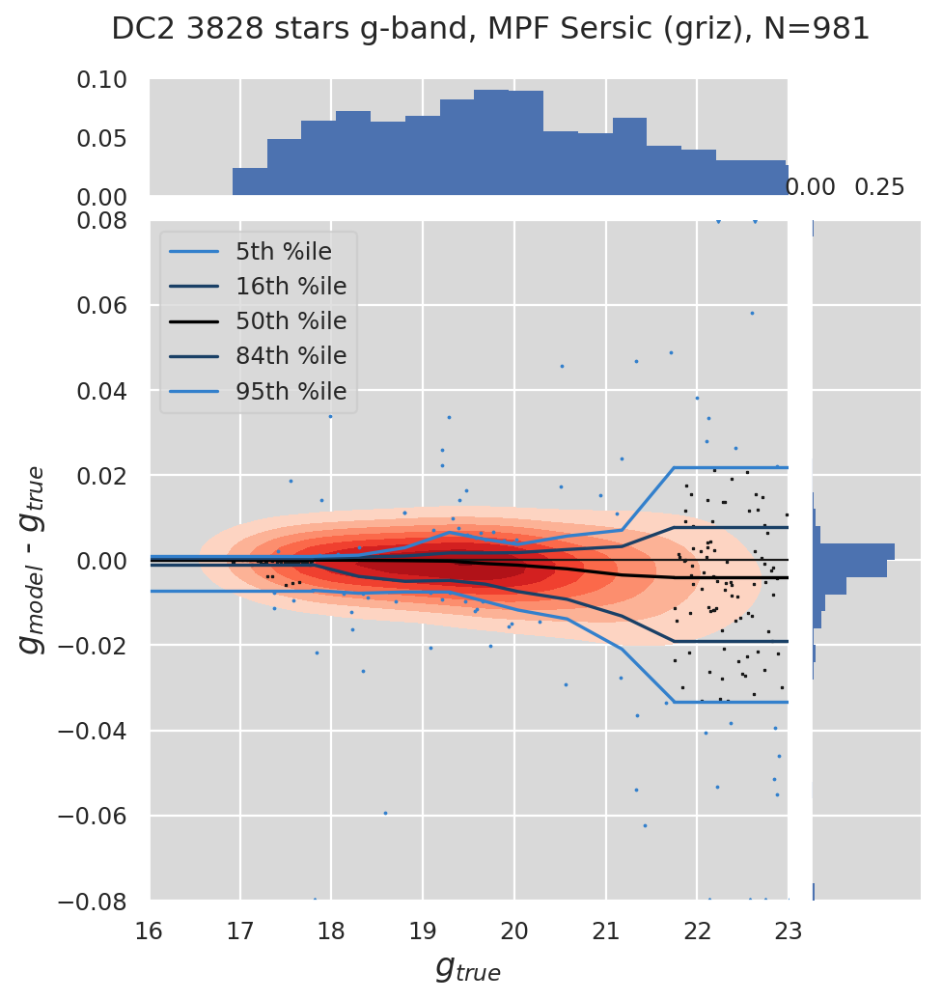

DC2 3828 stars r-band, MPF Sersic (griz), N=1014


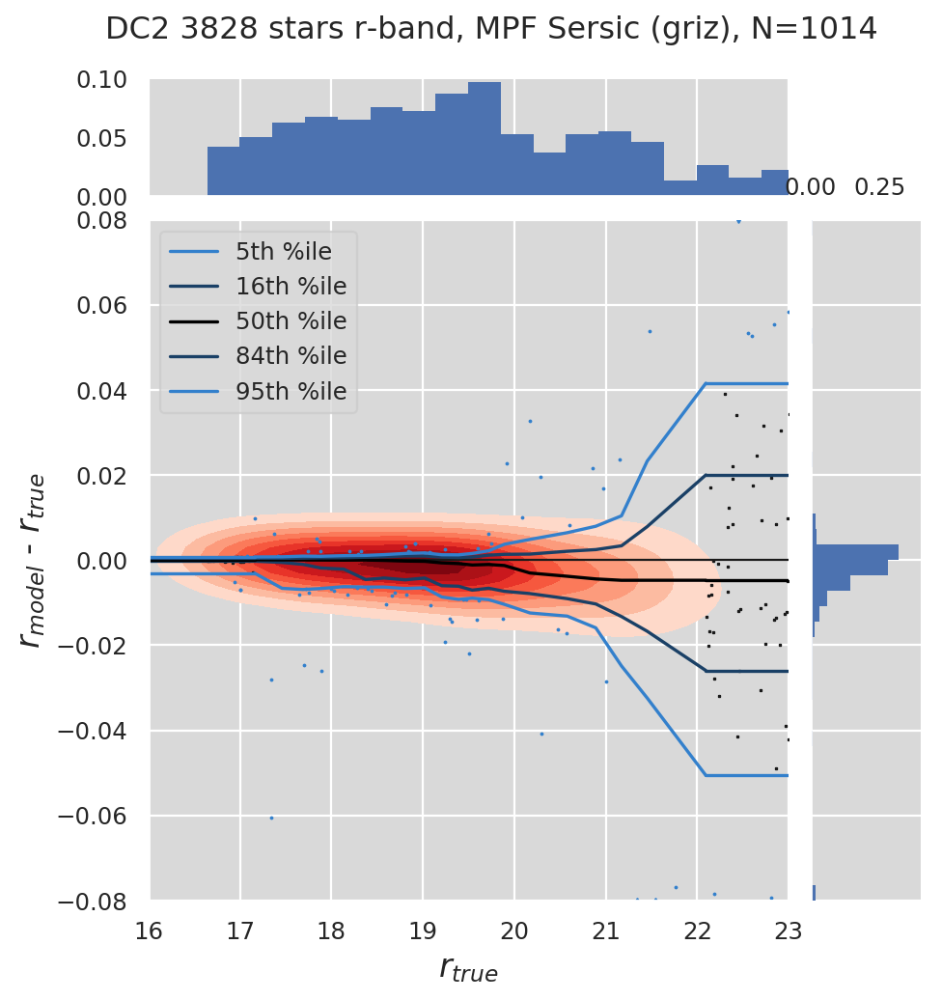

DC2 3828 stars g-r, MPF Sersic (griz), N=1014 3082 3082 3082
DC2 3828 stars i-band, MPF Sersic (griz), N=1025


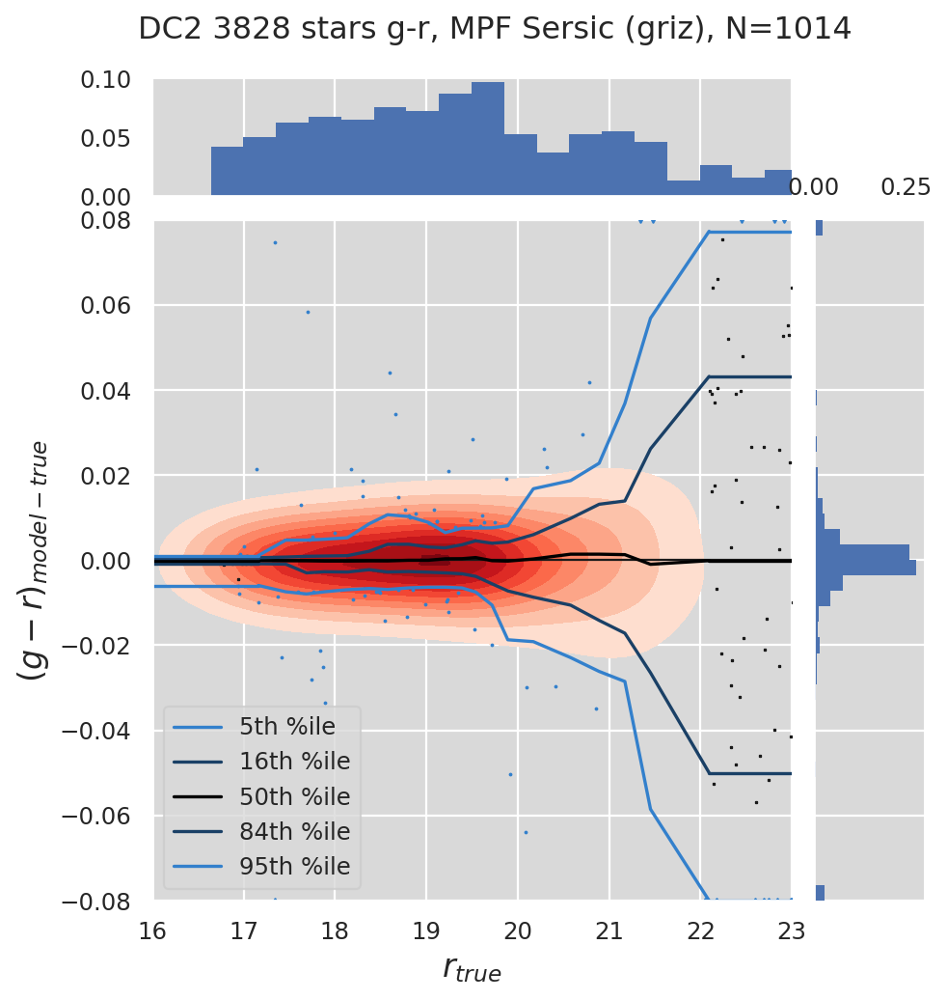

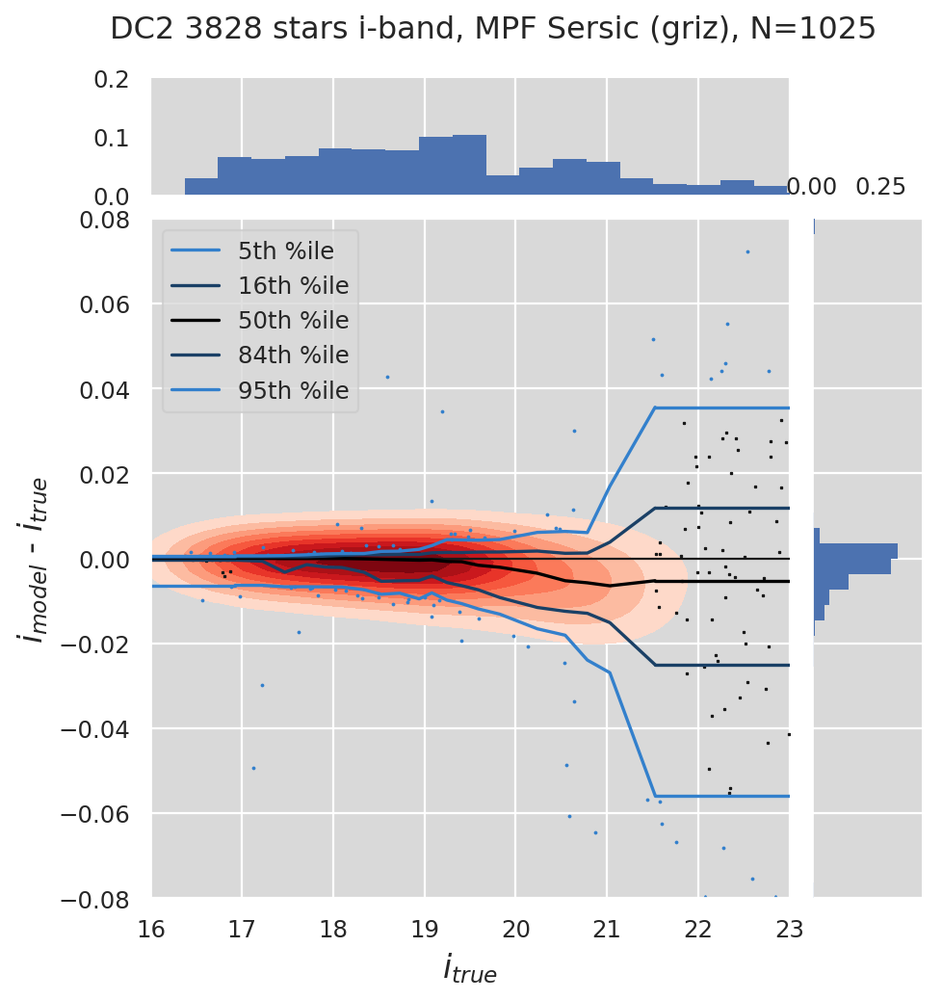

DC2 3828 stars r-i, MPF Sersic (griz), N=1025 3082 3082 3082
DC2 3828 stars z-band, MPF Sersic (griz), N=1086


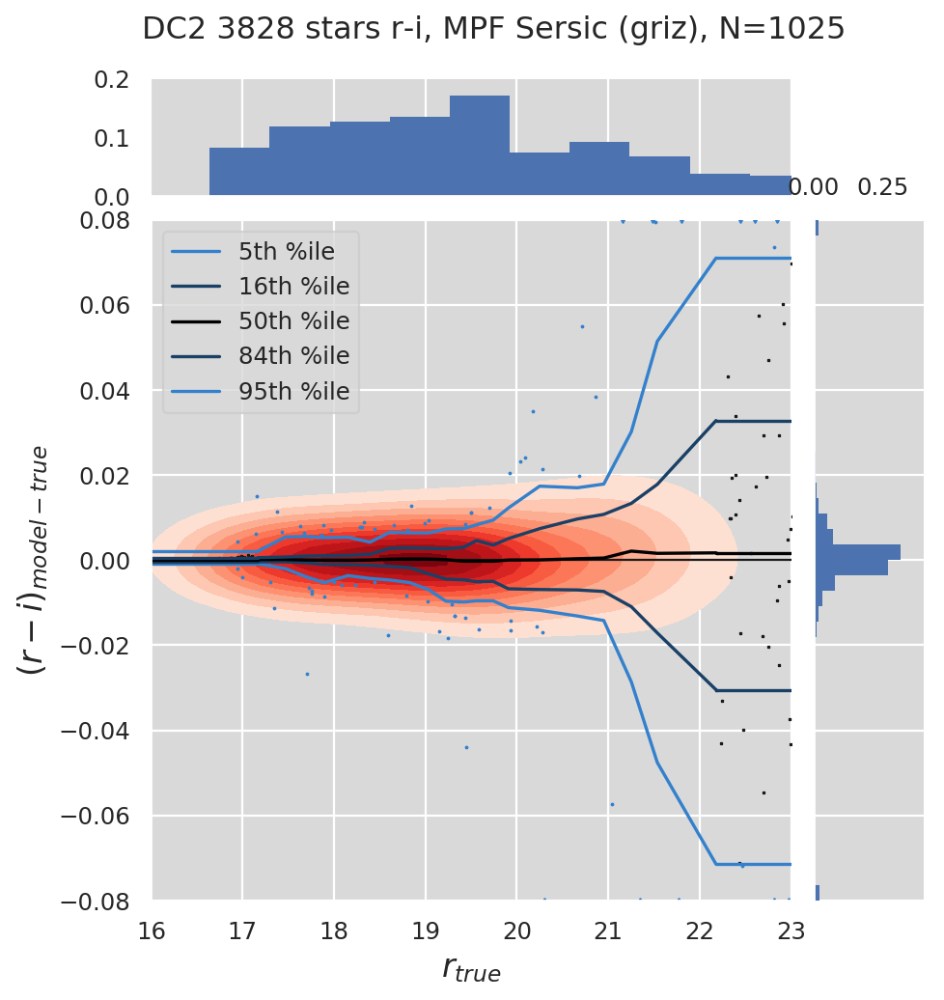

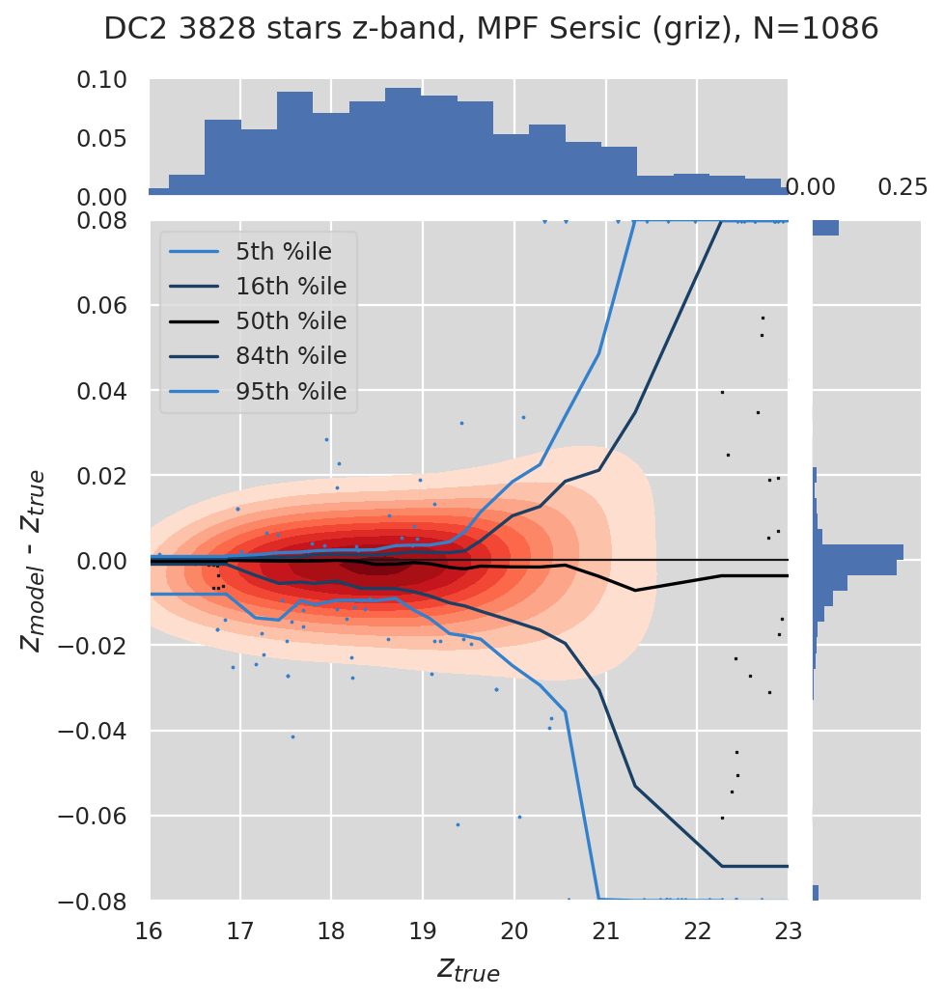

DC2 3828 stars i-z, MPF Sersic (griz), N=1086 3082 3082 3082
Tract 3828 has 732330 resolved sources and 6269 unresolved (MPF Sersic Free Amp.=multiprofit_mg8serbapx size < 0.02) totalling 3082 good sources
DC2 3828 stars g-band, MPF Sersic Free Amp. (griz), N=397


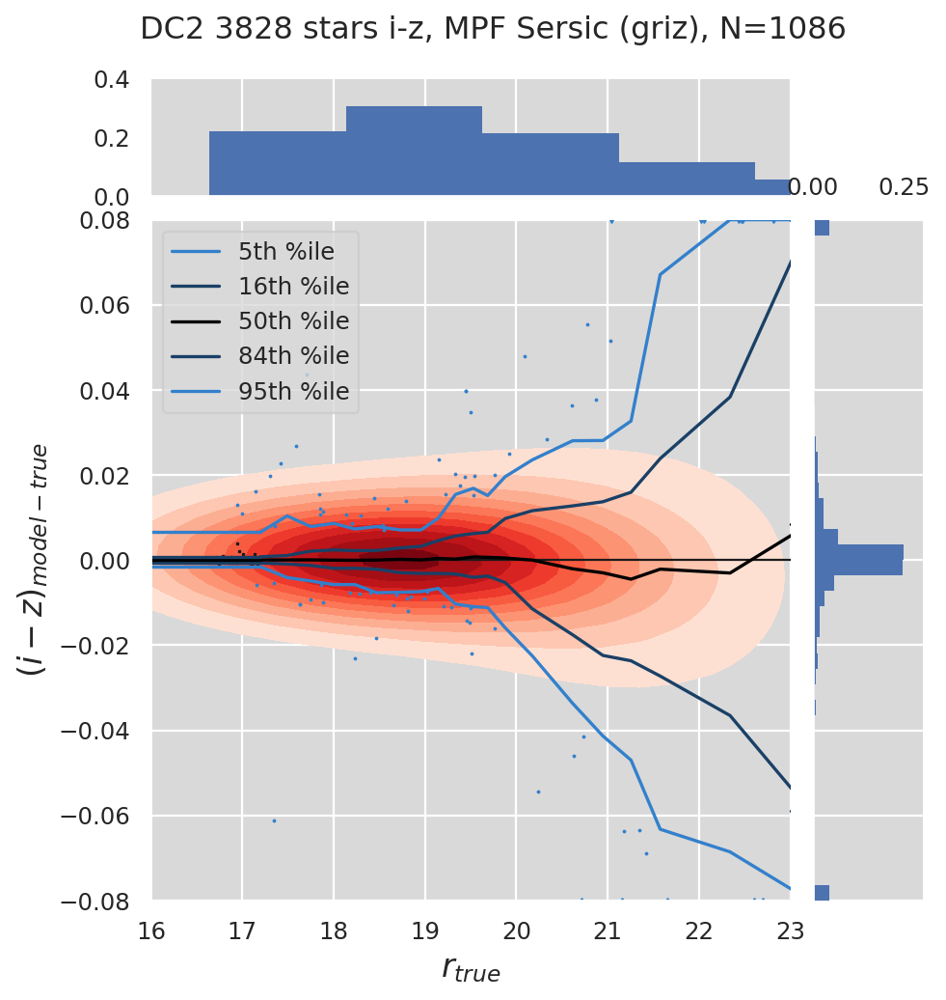

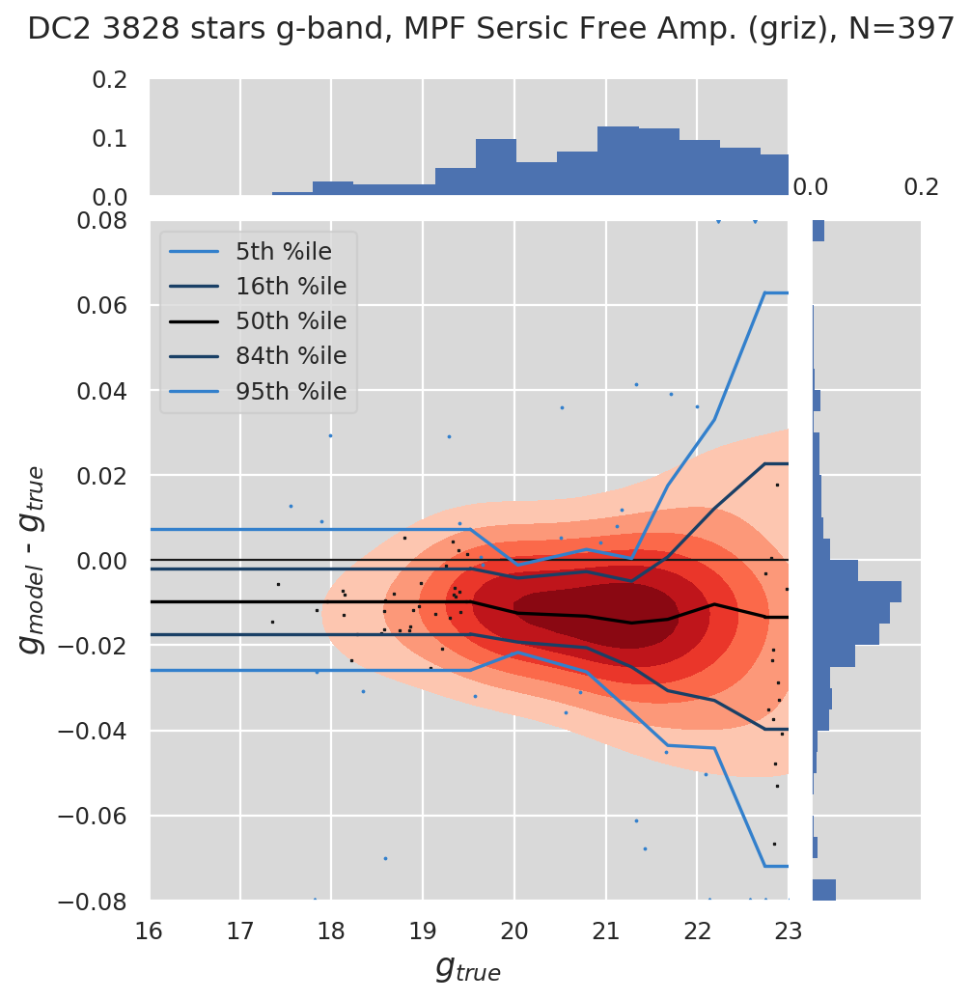

DC2 3828 stars r-band, MPF Sersic Free Amp. (griz), N=430


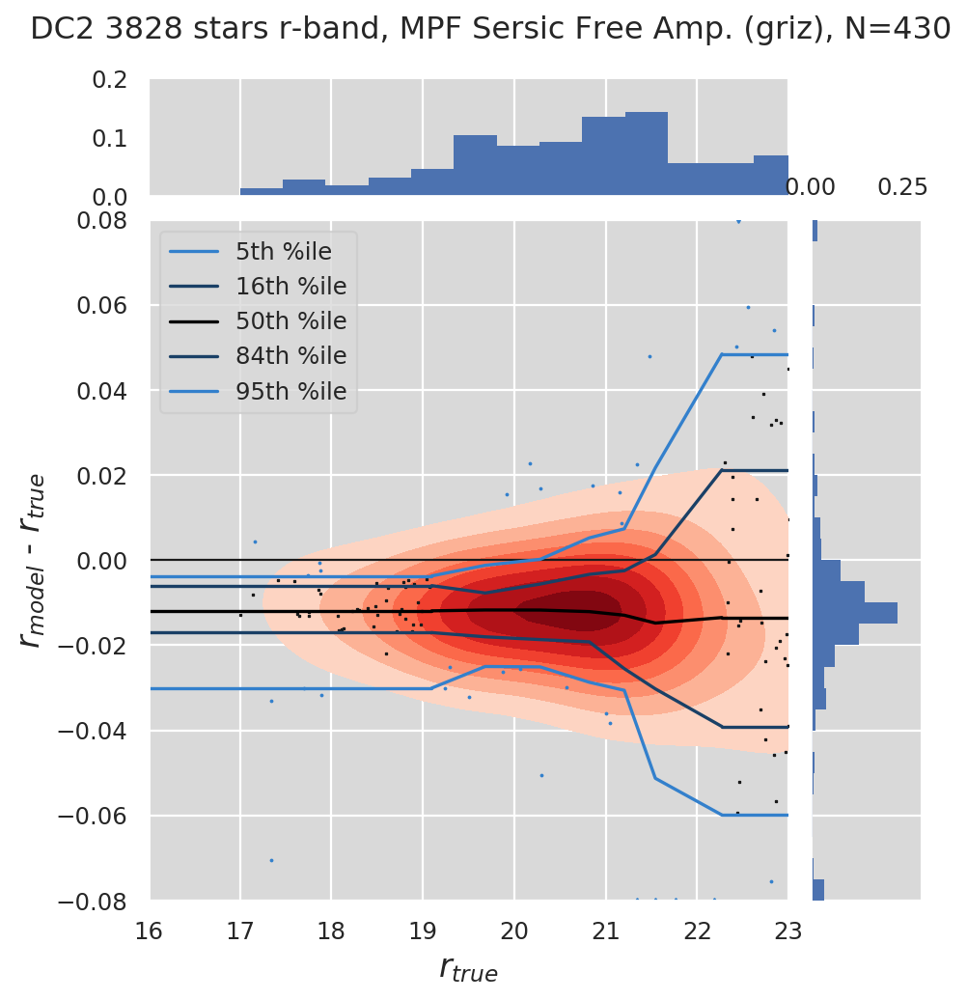

DC2 3828 stars g-r, MPF Sersic Free Amp. (griz), N=430 3082 3082 3082
DC2 3828 stars i-band, MPF Sersic Free Amp. (griz), N=442


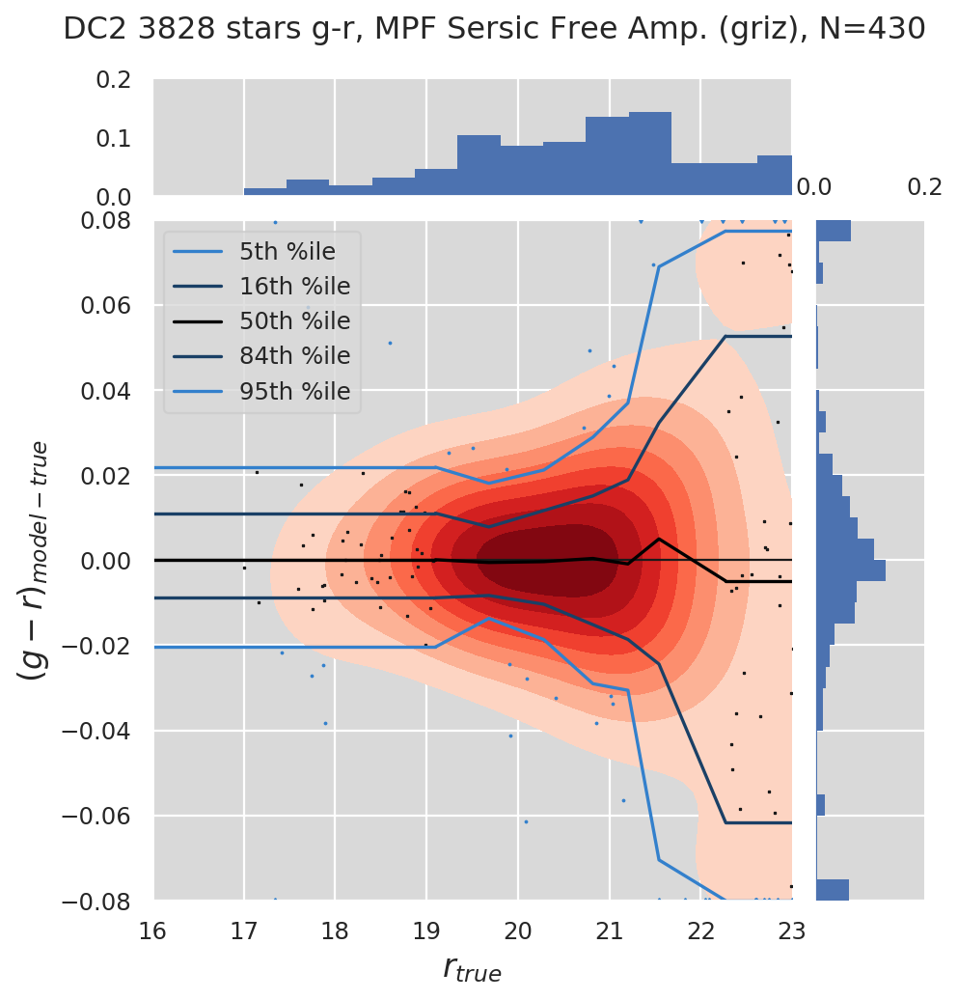

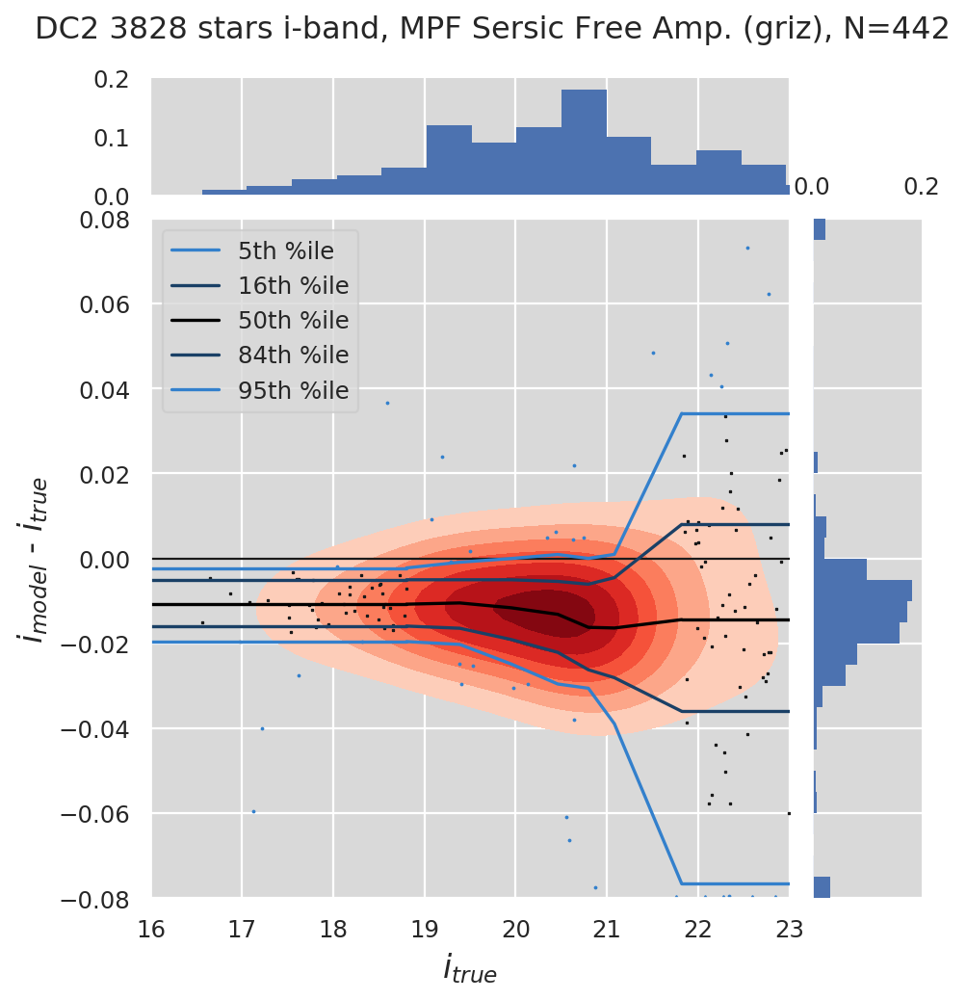

DC2 3828 stars r-i, MPF Sersic Free Amp. (griz), N=442 3082 3082 3082
DC2 3828 stars z-band, MPF Sersic Free Amp. (griz), N=502


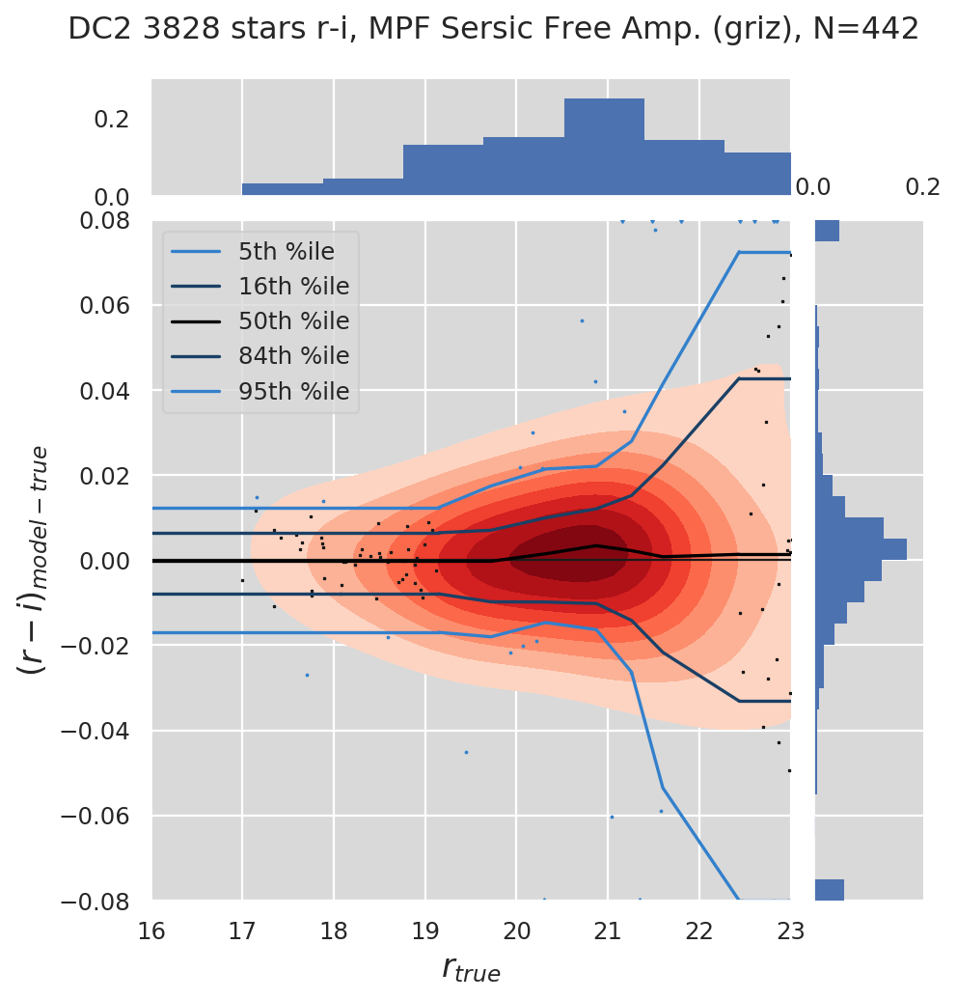

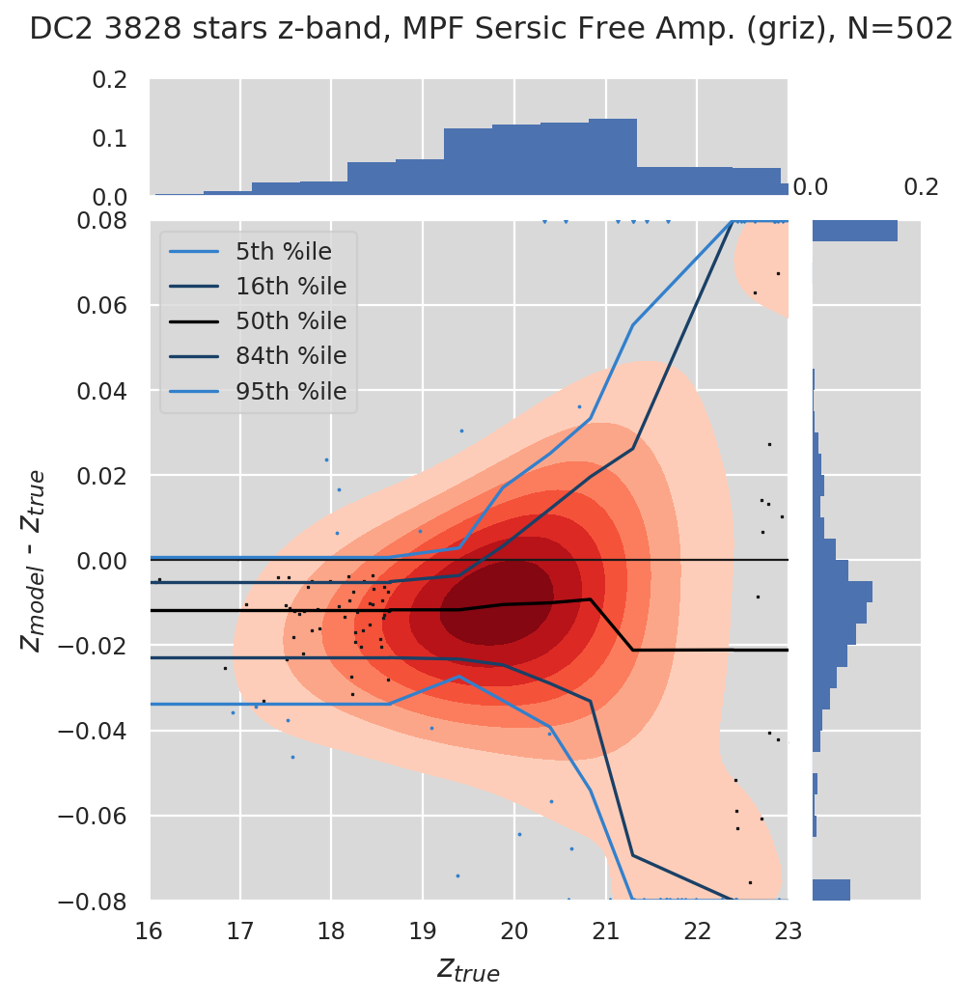

DC2 3828 stars i-z, MPF Sersic Free Amp. (griz), N=502 3082 3082 3082


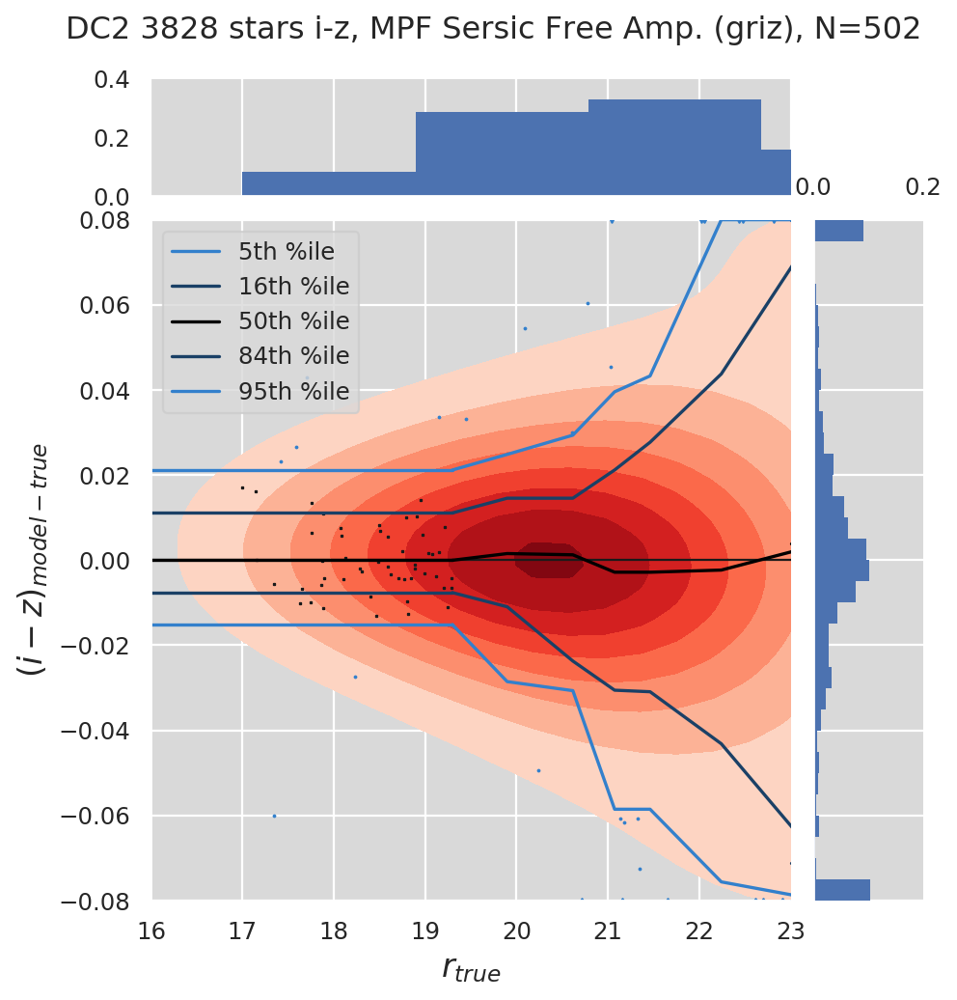

In [11]:
# Stars
plot_models(models, cats, cats_orig, band_multi, band_multi, is_galaxies=False, args_all=args, args_type=args_type['unresolved'])